In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split
import torch.nn as nn
from glob import glob
import torch
import torch.nn as nn
import torchvision
import os
import albumentations as A
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
import torchvision
from torchvision.datasets import ImageFolder
from PIL import Image
seed = 42
from torch.autograd import Variable
from torchvision.models import resnet
import torch.nn.functional as F

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Currently using "{device}" device.')


Currently using "cuda" device.


In [4]:
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

batch_size = 16
image_size = 448
in_channels=3
num_classes = 1
epochs = 75
threshold=0.6
path = r'D-linknetbcediceaug_model.pth'
# dataset_name='crack-detection-dataset'

In [5]:
count = 0
for root, folders, filenames in os.walk('/kaggle/input'):
   print(root, folders)

/kaggle/input ['test', 'train']
/kaggle/input/test ['images', 'masks']
/kaggle/input/test/images []
/kaggle/input/test/masks []
/kaggle/input/train ['images', 'masks']
/kaggle/input/train/images []
/kaggle/input/train/masks []


In [6]:
# /kaggle/input/sccdnetcorrected/train
# /kaggle/input/sccdnetcorrected/train/images
# /kaggle/input/sccdnetcorrected/train/images/CFD_002.jpg

In [7]:
path_images = '/kaggle/input/train/images'
path_masks = '/kaggle/input/train/masks'

In [8]:
# plt.imread(f"/kaggle/input/sccdnetcorrected/train/images/CFD_002.jpg")

In [9]:
def img_mask_loading(path_images,path_masks):
    train_img_paths=[os.path.join(path_images,i) for i in os.listdir(path_images)]
    train_mask_paths=[os.path.join(path_masks,i) for i in os.listdir(path_masks)]
    train_img_paths = sorted([str(p) for p in train_img_paths])
    train_mask_paths = sorted([str(p) for p in train_mask_paths])
    return (train_img_paths,train_mask_paths)
    

In [10]:
train_img,train_mask=img_mask_loading(path_images,path_masks)
train_img[0],train_mask[0]

('/kaggle/input/train/images/CFD_002.jpg',
 '/kaggle/input/train/masks/CFD_002.jpg')

In [11]:
# /kaggle/input/sccdnetcorrected/train/images/CFD_002.jpg

In [12]:
# plt.imshow(mask2)

In [13]:
# plt.imshow(img2)

In [14]:
# aug = A.HorizontalFlip(p=1)

In [15]:
df_train= pd.DataFrame({'images': train_img, 'masks': train_mask})

df_train.sample(2)

,images,masks
1056,/kaggle/input/train/images/GAPS384_train_0455_...,/kaggle/input/train/masks/GAPS384_train_0455_5...
410,/kaggle/input/train/images/CRACK500_20160307_1...,/kaggle/input/train/masks/CRACK500_20160307_16...


## TRansformations 

In [16]:
train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((image_size,image_size)),
    T.ToTensor()
])

In [17]:
# transforms=train_transforms(image=img1,mask=mask1)
# img2=transforms['image']
# mask2=transforms['mask']

In [18]:
img1 = plt.imread('/kaggle/input/train/images/CFD_002.jpg')

In [19]:
img1.shape

(448, 448, 3)

In [20]:
x=train_transforms(img1)

In [21]:
x.shape

torch.Size([3, 448, 448])

In [22]:
x

tensor([[[0.5294, 0.5098, 0.4863,  ..., 0.4941, 0.4824, 0.4627],
         [0.4980, 0.4863, 0.4863,  ..., 0.4863, 0.4627, 0.4392],
         [0.4706, 0.4667, 0.4745,  ..., 0.4784, 0.4471, 0.4196],
         ...,
         [0.2824, 0.2941, 0.2980,  ..., 0.4392, 0.4431, 0.4157],
         [0.2510, 0.2706, 0.2941,  ..., 0.4078, 0.3961, 0.3608],
         [0.2392, 0.2549, 0.2902,  ..., 0.3843, 0.3765, 0.3608]],

        [[0.5373, 0.5176, 0.4941,  ..., 0.5059, 0.4941, 0.4745],
         [0.5059, 0.4941, 0.4941,  ..., 0.4980, 0.4745, 0.4510],
         [0.4784, 0.4745, 0.4824,  ..., 0.4902, 0.4588, 0.4314],
         ...,
         [0.2863, 0.2980, 0.3020,  ..., 0.4353, 0.4392, 0.4118],
         [0.2549, 0.2745, 0.2980,  ..., 0.4039, 0.3922, 0.3569],
         [0.2431, 0.2588, 0.2941,  ..., 0.3804, 0.3725, 0.3569]],

        [[0.5255, 0.5059, 0.4824,  ..., 0.5255, 0.5137, 0.4941],
         [0.4941, 0.4824, 0.4824,  ..., 0.5176, 0.4941, 0.4706],
         [0.4667, 0.4627, 0.4706,  ..., 0.5098, 0.4784, 0.

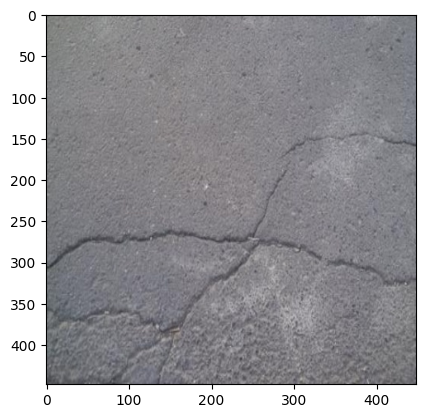

In [23]:
plt.imshow(x.permute(1,2,0))

In [24]:
train_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

### Transformations

In [25]:
# random_crop = torchvision.transforms.RandomCrop((448, 448), fill=0, padding_mode='constant')

# # Apply the transform to your image
# cropped_image = random_crop(img1_tensor)

In [26]:
# plt.imshow(cropped_image.permute(1,2,0))

In [27]:
# cropped_image.shape

In [28]:
# x=train_transforms(img1)

In [29]:
class ImgToTensor(object):
    def __call__(self, img):
        tf = T.Compose([T.ToTensor(),                                                                                    
])
        return tf(img)


class MaskToTensor(object):
    def __call__(self, img):
        return torch.from_numpy(img).long()

## Dataset Loading

In [30]:
class CrackDataset(Dataset):
    """ dataset class for Crack datasets
    """
    
    def __init__(self,dataset, isTrain=False, resize=True):
#         self.img_dir = img_dir
#         self.img_fnames = img_fnames

#         self.mask_dir = mask_dir
#         self.mask_fnames = mask_fnames
        self.dataset=dataset
        self.resize  = resize
        self.isTrain = isTrain
#  A.augmentations.crops.transforms.RandomResizedCrop(256,256,p=0.5),
        self.aug = A.Compose([
                           
                            A.augmentations.MotionBlur(p=0.1),
                            A.augmentations.transforms.ColorJitter(),
                            A.augmentations.geometric.rotate.SafeRotate(),
                            A.HorizontalFlip(),
                            A.VerticalFlip(),
                            A.augmentations.geometric.rotate.RandomRotate90(p=0.5)
                            ])

        self.img_totensor  = ImgToTensor()

        self.mask_totensor = MaskToTensor()
                
    def __getitem__(self, i):
        # read a image given a random integer index
#         fname = self.img_fnames[i]
        row = self.dataset.loc[i].squeeze()
#         image_path = row['images']
#         mask_path = row['masks']
        fpath = row['images']
        img = cv2.imread(fpath) 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)                                    # H,W,3 np.uint8


        mpath = row['masks']
        mask = cv2.imread(mpath, cv2.COLOR_BGR2GRAY)                                  # H,W, np.uint8

        if self.isTrain:
            img  = cv2.resize(img, (image_size,image_size), interpolation=cv2.INTER_CUBIC)         # (256,256,3) np.uint8
            mask = cv2.resize(mask, (image_size,image_size), interpolation=cv2.INTER_CUBIC)        # (256,256) np.uint8

            # image augmentation     
            transformed = self.aug(image=img, mask=mask)
            img  = transformed['image']                                               # (256,256,3) np.uint8
            mask = transformed['mask']                                                # (256,256) np.uint8            
            
            # binarize segmentation
            _, mask = cv2.threshold(mask, 127, 1, cv2.THRESH_BINARY)
        
            # totensor
            img  = self.img_totensor(Image.fromarray(img.copy()))
            mask = (self.mask_totensor(mask.copy()).unsqueeze(0)).float()
        
                           

            return img,mask

        else:
            if self.resize:
                img  = cv2.resize(img, (image_size,image_size), interpolation=cv2.INTER_CUBIC)     # (256,256,3) np.uint8
                mask = cv2.resize(mask, (image_size,image_size), interpolation=cv2.INTER_CUBIC)    # (256,256) np.uint8
                img  = self.img_totensor(Image.fromarray(img.copy()))
                
            _, mask = cv2.threshold(mask, 127, 1, cv2.THRESH_BINARY)
            mask = (self.mask_totensor(mask.copy()).unsqueeze(0)).float()

            return img,mask
                    

    def __len__(self):
        """Return the total number of images in the dataset."""
        return len(self.dataset)

In [31]:
# class CrackDataset(Dataset):
#     def __init__(self, dataset, transforms=None):
#         self.dataset = dataset.reset_index(drop=True)
#         self.transforms = transforms
        
#     def __len__(self):
#         return len(self.dataset)
    
#     def __getitem__(self, ix):
#         row = self.dataset.loc[ix].squeeze()
#         image_path = row['images']
#         mask_path = row['masks']
        
#         image = cv2.imread(image_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         if self.transforms:
#             image_tensor = self.transforms(image).float()
#         else:
#             image_tensor=T.ToPILImage()(image)
#             image_tensor=T.ToTensor()((image_tensor))
            
       

        
#         mask = cv2.imread(mask_path)
#         mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
#         mask = cv2.resize(mask, (image_size, image_size))
#         _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
#         mask=mask/255.0
            
#         mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
        
#         # mask_tensor /= 255.
        
#         return image_tensor, mask_tensor
    
# #     def collate_fn(self, batch):
# #         images, masks = tuple(zip(*batch))
# #         images = [img[None] for img in images]
# #         masks = [msk[None] for msk in masks]
# #         images, masks = [torch.cat(i).to(device) for i in [images, masks]]
# #         return images, masks

In [32]:
# df_train['masks'][0]

In [33]:
# mask2=cv2.imread(df_train['masks'][0], cv2.IMREAD_GRAYSCALE)

In [34]:
# ((mask2>0)&(mask2<255)).sum()

In [35]:
train_dataset= CrackDataset(df_train,isTrain=True)

In [36]:
train_dataset[12]

(tensor([[[0.5216, 0.4863, 0.4902,  ..., 0.5098, 0.5137, 0.4863],
          [0.4392, 0.4471, 0.5255,  ..., 0.4784, 0.4941, 0.4902],
          [0.4745, 0.4941, 0.4941,  ..., 0.4588, 0.5020, 0.5294],
          ...,
          [0.5020, 0.4706, 0.4471,  ..., 0.4627, 0.4157, 0.4000],
          [0.5216, 0.4941, 0.4667,  ..., 0.4941, 0.4549, 0.4706],
          [0.5608, 0.4706, 0.4824,  ..., 0.4980, 0.4824, 0.4902]],
 
         [[0.5137, 0.4706, 0.4745,  ..., 0.5020, 0.5059, 0.4784],
          [0.4314, 0.4353, 0.5098,  ..., 0.4706, 0.4863, 0.4824],
          [0.4667, 0.4863, 0.4824,  ..., 0.4510, 0.4941, 0.5216],
          ...,
          [0.4941, 0.4627, 0.4392,  ..., 0.4549, 0.4078, 0.3922],
          [0.5137, 0.4863, 0.4588,  ..., 0.4863, 0.4471, 0.4627],
          [0.5529, 0.4627, 0.4745,  ..., 0.4902, 0.4745, 0.4824]],
 
         [[0.5255, 0.4745, 0.4784,  ..., 0.5137, 0.5176, 0.4902],
          [0.4431, 0.4471, 0.5137,  ..., 0.4824, 0.4980, 0.4941],
          [0.4784, 0.4980, 0.4902,  ...,

In [37]:
# (train_dataset[1][1]==1.0).sum()

In [38]:
z=train_dataset[12]
z[0].shape

torch.Size([3, 448, 448])

In [39]:
((z[1]>0)&(z[1]<1)).sum()

tensor(0)

In [40]:
z[1].shape

torch.Size([1, 448, 448])

In [41]:
# z=z[0].detach().cpu().numpy()

In [42]:
# (z[1]>1).sum()

In [43]:
def show_one(image,mask):
    plt.subplot(121)
    plt.imshow(image.cpu().detach().numpy().transpose(1,2,0))
    plt.subplot(122)
    plt.imshow(mask.cpu().detach().numpy().transpose(1,2,0), cmap='gray')

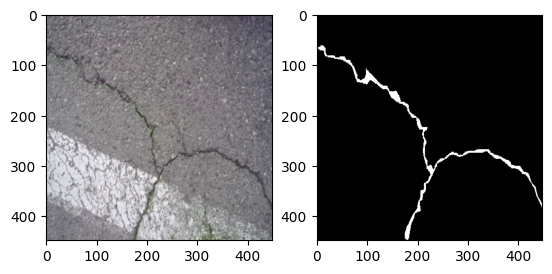

In [44]:
show_one(z[0],z[1])

## valid dataset

In [45]:
v_path_images = f'/kaggle/input/test/images'
v_path_masks = f'/kaggle/input/test/masks'


In [46]:
valid_img,valid_mask=img_mask_loading(v_path_images,v_path_masks)

In [47]:
valid_img[0],valid_mask[0]

('/kaggle/input/test/images/CFD_001.jpg',
 '/kaggle/input/test/masks/CFD_001.jpg')

In [48]:
df_valid= pd.DataFrame({'images': valid_img, 'masks': valid_mask})

df_valid.sample(2)

,images,masks
746,/kaggle/input/test/images/cracktree200_6234.jpg,/kaggle/input/test/masks/cracktree200_6234.jpg
671,/kaggle/input/test/images/Rissbilder_for_Flori...,/kaggle/input/test/masks/Rissbilder_for_Floria...


In [49]:
df_valid

,images,masks
0,/kaggle/input/test/images/CFD_001.jpg,/kaggle/input/test/masks/CFD_001.jpg
1,/kaggle/input/test/images/CFD_007.jpg,/kaggle/input/test/masks/CFD_007.jpg
2,/kaggle/input/test/images/CFD_011.jpg,/kaggle/input/test/masks/CFD_011.jpg
3,/kaggle/input/test/images/CFD_013.jpg,/kaggle/input/test/masks/CFD_013.jpg
4,/kaggle/input/test/images/CFD_014.jpg,/kaggle/input/test/masks/CFD_014.jpg
...,...,...
1000,/kaggle/input/test/images/noncrack_noncrack_co...,/kaggle/input/test/masks/noncrack_noncrack_con...
1001,/kaggle/input/test/images/noncrack_noncrack_co...,/kaggle/input/test/masks/noncrack_noncrack_con...
1002,/kaggle/input/test/images/noncrack_noncrack_co...,/kaggle/input/test/masks/noncrack_noncrack_con...
1003,/kaggle/input/test/images/noncrack_noncrack_co...,/kaggle/input/test/masks/noncrack_noncrack_con...


### Valid loader

In [50]:
valid_dataset = CrackDataset(df_valid)

In [51]:
v1=valid_dataset[0]

In [52]:
v1

(tensor([[[0.4706, 0.4157, 0.3765,  ..., 0.4863, 0.4902, 0.4863],
          [0.4471, 0.4078, 0.3882,  ..., 0.4745, 0.4824, 0.4902],
          [0.4275, 0.4078, 0.4118,  ..., 0.4706, 0.4784, 0.5098],
          ...,
          [0.3843, 0.4157, 0.4392,  ..., 0.4588, 0.4745, 0.4588],
          [0.4078, 0.4275, 0.4314,  ..., 0.4863, 0.4863, 0.4431],
          [0.4039, 0.4196, 0.4118,  ..., 0.5098, 0.4980, 0.4392]],
 
         [[0.4902, 0.4353, 0.3961,  ..., 0.5020, 0.5059, 0.5020],
          [0.4667, 0.4275, 0.4078,  ..., 0.4902, 0.4980, 0.5059],
          [0.4471, 0.4275, 0.4314,  ..., 0.4863, 0.4941, 0.5255],
          ...,
          [0.3922, 0.4235, 0.4471,  ..., 0.4745, 0.4902, 0.4745],
          [0.4157, 0.4353, 0.4392,  ..., 0.5020, 0.5020, 0.4588],
          [0.4118, 0.4275, 0.4196,  ..., 0.5255, 0.5137, 0.4549]],
 
         [[0.4745, 0.4196, 0.3804,  ..., 0.5059, 0.5098, 0.5059],
          [0.4510, 0.4118, 0.3922,  ..., 0.4941, 0.5020, 0.5098],
          [0.4314, 0.4118, 0.4157,  ...,

In [53]:
# ((z[1]>0)&(z[1]<1)).sum()

In [54]:
((v1[1]>0)&(v1[1]<1.0)).sum()

tensor(0)

In [55]:
v1[1].dtype

torch.float32

Index:  420


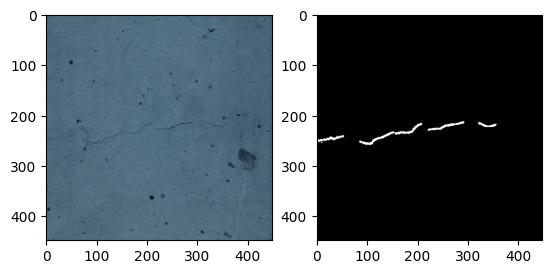

In [56]:
x=np.random.randint(0, len(df_valid))
print("Index: ",x)
plt.subplot(121)
plt.imshow(valid_dataset[x][0].cpu().detach().numpy().transpose(1,2,0))
plt.subplot(122)
plt.imshow(valid_dataset[x][1].cpu().detach().numpy().transpose(1,2,0), cmap='gray')

**Data Loaders **

In [57]:
train_dataloader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=True)

In [58]:
for i in train_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([16, 3, 448, 448])
torch.Size([16, 1, 448, 448])


In [59]:
for i in valid_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([16, 3, 448, 448])
torch.Size([16, 1, 448, 448])


## model building

### link net

In [60]:
# Deep network models

from functools import partial

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

nonlinearity = partial(F.relu, inplace=True)


class SPPblock(nn.Module):
    def __init__(self, in_channels):
        super(SPPblock, self).__init__()
        self.pool1 = nn.MaxPool2d(kernel_size=[2, 2], stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=[3, 3], stride=3)
        self.pool3 = nn.MaxPool2d(kernel_size=[5, 5], stride=5)
        # self.pool4 = nn.MaxPool2d(kernel_size=[6, 6], stride=6)

        self.conv = nn.Conv2d(in_channels=in_channels, out_channels=1, kernel_size=1, padding=0)

    def forward(self, x):
        self.in_channels, h, w = x.size(1), x.size(2), x.size(3)

        self.layer1 = F.upsample(self.conv(self.pool1(x)), size=(h, w), mode="bilinear")
        self.layer2 = F.upsample(self.conv(self.pool2(x)), size=(h, w), mode="bilinear")
        self.layer3 = F.upsample(self.conv(self.pool3(x)), size=(h, w), mode="bilinear")
        # self.layer4 = F.upsample(self.conv(self.pool4(x)), size=(h, w), mode="bilinear")

        out = torch.cat([self.layer1, self.layer2, self.layer3,
                         # self.layer4,
                         x], 1)

        return out


class HDCblock(nn.Module):
    def __init__(self, channel):
        super(HDCblock, self).__init__()
        self.dilate1 = nn.Conv2d(channel, channel, kernel_size=3, dilation=1, padding=1)
        self.dilate2 = nn.Conv2d(channel, channel, kernel_size=3, dilation=2, padding=2)
        self.dilate3 = nn.Conv2d(channel, channel, kernel_size=3, dilation=4, padding=4)
        # self.dilate4 = nn.Conv2d(channel, channel, kernel_size=3, dilation=8, padding=8)
        # self.dilate5 = nn.Conv2d(channel, channel, kernel_size=3, dilation=16, padding=16)
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                if m.bias is not None:
                    m.bias.data.zero_()

    def forward(self, x):
        dilate1_out = nonlinearity(self.dilate1(x))
        dilate2_out = nonlinearity(self.dilate2(dilate1_out))
        dilate3_out = nonlinearity(self.dilate3(dilate2_out))
        # dilate4_out = nonlinearity(self.dilate4(dilate3_out))
        # dilate5_out = nonlinearity(self.dilate5(dilate4_out))
        out = x + dilate1_out + dilate2_out + dilate3_out  # + dilate4_out + dilate5_out

        return out


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, n_filters):
        super(DecoderBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, in_channels // 4, 1)
        self.norm1 = nn.BatchNorm2d(in_channels // 4)
        self.relu1 = nonlinearity

        self.deconv2 = nn.ConvTranspose2d(in_channels // 4, in_channels // 4, 3, stride=2, padding=1, output_padding=1)
        self.norm2 = nn.BatchNorm2d(in_channels // 4)
        self.relu2 = nonlinearity

        self.conv3 = nn.Conv2d(in_channels // 4, n_filters, 1)
        self.norm3 = nn.BatchNorm2d(n_filters)
        self.relu3 = nonlinearity

    def forward(self, x):
        x = self.conv1(x)
        x = self.norm1(x)
        x = self.relu1(x)
        x = self.deconv2(x)
        x = self.norm2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.norm3(x)
        x = self.relu3(x)

        return x


class DPLinkNet34(nn.Module):
    def __init__(self, num_classes=1):
        super(DPLinkNet34, self).__init__()

        filters = [64, 128, 256, 512]
        resnet = models.resnet34(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.dblock = HDCblock(filters[3])
        self.spp = SPPblock(filters[3])

        self.decoder4 = DecoderBlock(filters[3] + 3, filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 4, 2, 1)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 3, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Center
        e4 = self.dblock(e4)
        e4 = self.spp(e4)

        # Decoder
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)

        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return out


class DLinkNet34_less_pool(nn.Module):
    def __init__(self, num_classes=1):
        super(DLinkNet34_less_pool, self).__init__()

        filters = [64, 128, 256, 512]
        resnet = models.resnet34(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3

        self.dblock = HDCblock(filters[2])

        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 4, 2, 1)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 3, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)

        # Center
        e3 = self.dblock(e3)

        # Decoder
        d3 = self.decoder3(e3) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)

        # Final Classification
        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return out


class DLinkNet34(nn.Module):
    def __init__(self, num_classes=1):
        super(DLinkNet34, self).__init__()

        filters = [64, 128, 256, 512]
        resnet = models.resnet34(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.dblock = HDCblock(filters[3])

        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 4, 2, 1)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 3, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Center
        e4 = self.dblock(e4)

        # Decoder
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)

        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return F.sigmoid(out)


class DLinkNet50(nn.Module):
    def __init__(self, num_classes=1):
        super(DLinkNet50, self).__init__()

        filters = [256, 512, 1024, 2048]
        resnet = models.resnet50(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.dblock = HDCblock(filters[3])

        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 4, 2, 1)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 3, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Center
        e4 = self.dblock(e4)

        # Decoder
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)
        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return F.sigmoid(out)


class DLinkNet101(nn.Module):
    def __init__(self, num_classes=1):
        super(DLinkNet101, self).__init__()

        filters = [256, 512, 1024, 2048]
        resnet = models.resnet101(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.dblock = HDCblock(filters[3])

        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 4, 2, 1)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 3, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Center
        e4 = self.dblock(e4)

        # Decoder
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)
        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return F.sigmoid(out)


class LinkNet34(nn.Module):
    def __init__(self, num_classes=1):
        super(LinkNet34, self).__init__()

        filters = [64, 128, 256, 512]
        resnet = models.resnet34(pretrained=True)
        self.firstconv = resnet.conv1
        self.firstbn = resnet.bn1
        self.firstrelu = resnet.relu
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 3, stride=2)
        self.finalrelu1 = nonlinearity
        self.finalconv2 = nn.Conv2d(32, 32, 3)
        self.finalrelu2 = nonlinearity
        self.finalconv3 = nn.Conv2d(32, num_classes, 2, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Decoder
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)
        out = self.finaldeconv1(d1)
        out = self.finalrelu1(out)
        out = self.finalconv2(out)
        out = self.finalrelu2(out)
        out = self.finalconv3(out)

        return F.sigmoid(out)

In [61]:
# enc1=torchvision.models.vgg16_bn().features()
# enc1

In [62]:
# enc1

In [63]:
model= DPLinkNet34()
model=model.to(device)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 145MB/s]


In [64]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Number of parameters in the model: {total_params/1000000} M")

Number of parameters in the model: 28.737218 M


In [65]:
model

DPLinkNet34(
  (firstconv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (firstbn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (firstrelu): ReLU(inplace=True)
  (firstmaxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (encoder1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (rel

In [66]:
inp=torch.randn(4,3,448,448)
inp=inp.to(device)
out=model(inp)
out

tensor([[[[ 0.0502,  0.0496,  0.0647,  ...,  0.0775,  0.0542,  0.0578],
          [ 0.0369,  0.0546, -0.0215,  ...,  0.0222,  0.0228,  0.0588],
          [ 0.0315,  0.0164,  0.0177,  ...,  0.0999,  0.0771,  0.0406],
          ...,
          [ 0.0474,  0.0497,  0.0444,  ...,  0.0271,  0.0211,  0.0366],
          [ 0.0475,  0.0411,  0.0463,  ...,  0.0103,  0.0693,  0.0379],
          [ 0.0611,  0.0439,  0.0347,  ...,  0.0296,  0.0575,  0.0458]]],


        [[[ 0.0388,  0.0198,  0.0091,  ...,  0.0413,  0.0366,  0.0728],
          [ 0.0324, -0.0002, -0.0276,  ...,  0.0131,  0.0112,  0.0481],
          [ 0.0197, -0.0070,  0.0454,  ...,  0.0571,  0.0351,  0.0417],
          ...,
          [ 0.0513,  0.0272,  0.0435,  ...,  0.0147,  0.0267,  0.0442],
          [ 0.0535,  0.0283,  0.0534,  ...,  0.0225,  0.0503,  0.0489],
          [ 0.0555,  0.0394,  0.0334,  ...,  0.0413,  0.0469,  0.0409]]],


        [[[ 0.0349,  0.0417,  0.0131,  ...,  0.0373,  0.0502,  0.0671],
          [ 0.0280,  0.019

In [67]:
out.shape

torch.Size([4, 1, 448, 448])

In [68]:
# outputs=None
# model=model.to(device)
# for i in train_dataloader:
#     model.eval()
#     inputs,masks=i
#     inputs=inputs.to(device)
#     masks=masks.to(device)
#     outputs=model(inputs)
# #     metrics=find_metrics(outputs,masks)
    
#     break
# print(outputs.shape)

In [69]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = YourModel().to(device)  # Replace YourModel with your actual model
# input_tensor = torch.randn(batch_size, 3, 448, 448).to(device)
# 

In [70]:
# out_tensor = torch.randint(0, 2, (batch_size, 1, 448, 448), device=device)


In [71]:
# input_tensor.shape

In [72]:
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [73]:
# Ensure that all caches are empty (not necessary but can provide a more accurate measurement)
# torch.cuda.empty_cache()

# # Perform a forward pass to allocate memory
# output_tensor = model(input_tensor)


# # Measure GPU memory usage
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [74]:
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# # early = EarlyStopping()


# # Loss function and optimizer
# criterion = nn.BCEWithLogitsLoss()
# loss = criterion(output_tensor, output_tensor)
# loss.backward()
# optimizer.step()

### Deep Lab v3

In [75]:
# model=get_model(1,True)

In [76]:
# model

In [77]:
# model=model.to(device)

In [78]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, path=path):
        self.path = path
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = np.inf
        self.early_stop = False
        
    def __call__(self, val_loss, model=None):
        if self.best_loss - val_loss > self.min_delta:
            torch.save(model.state_dict(), self.path)
            print(f'Model saved to: {self.path}')
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [79]:
# test_transforms=T.Compose([
#     T.ToPILImage(),
#       # Apply augmentation transforms with a 50% probability
#     T.Resize((image_size,image_size)),
#     T.ToTensor(),
# ])

In [80]:
test_transforms=T.Compose([
    T.ToPILImage(),
    T.Resize((image_size,image_size)),
    T.ToTensor()
])

In [81]:
test_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

In [82]:
# outputs=None
# model=model.to(device)
# for i in train_dataloader:
#     model.eval()
#     inputs,masks=i
#     inputs=inputs.to(device)
#     masks=masks.to(device)
#     outputs=model(inputs)
# #     metrics=find_metrics(outputs,masks)
    
#     break

In [83]:
# outputs

In [84]:
# model.name

In [85]:
# outputs['out'][0].dtype

In [86]:
@torch.no_grad()
def validate_test_image(model, dataset,n=None):
    if n:
        idx=n
    else:
        idx = np.random.randint(len(dataset))

    dataset = dataset.reset_index(drop=True)
    row = dataset.loc[idx].squeeze()
    
    image = cv2.imread(row['images'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_tensor = test_transforms(image).unsqueeze(0).to(device)
    
    mask = cv2.imread(row['masks'])
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask = cv2.resize(mask, (image_size, image_size))
    _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    
#     print((mask==255).sum())

    mask=np.expand_dims(mask, axis=-1)

    
    
    
    print("shape of image",image_tensor.shape,"mask.shape",mask.shape)
    model.eval()
    output = model(image_tensor)
    
#     print(output.shape)
    output=output.squeeze(0)
    
#     print(output.shape)
#     print(output)
    output=torch.sigmoid(output)

    output=output.detach().cpu()
#     print(output)
    output=(output > threshold).float()
    
    
#     print(((output>0.0) & (output<1.0)).sum())
    output=output.numpy().transpose(1,2,0)
    

  
    
    plt.figure(figsize=(8, 4))
    plt.subplot(131)
    plt.title('Original image')
    plt.imshow(image)
    
    plt.subplot(132)
    plt.title('Original mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(133)
    plt.title('Predicted mask')
    plt.imshow(output,cmap="gray")
    
#     print(output)
    
    plt.tight_layout()
    plt.show()
    plt.pause(0.001)

shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


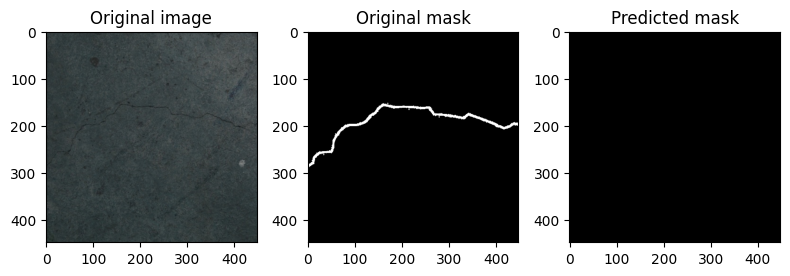

In [87]:
validate_test_image(model, df_valid)

In [88]:
# def train_one_batch(batch, model, criterion, optimizer):
#     images, masks = batch
#     optimizer.zero_grad()
#     plt.imshow(image)
    
#     plt.subplot(132)
#     plt.title('Original mask')
#     plt.imshow(mask, cmap='gray')
    
#     plt.subplot(133)
#     plt.title('Predicted mask')
#     plt.imshow(output, cmap='gray')
# #     print(output)
    
#     plt.tight_layout()
#     plt.show()
#     output = model(images)
#     loss = criterion(output, masks,reduction='mean',alpha=0.7,gamma=1.5)
#     loss.backward()
#     optimizer.step()
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     return loss.item(),dice_loss
# @torch.no_grad()

# def validate_one_batch(batch, model, criterion):
#     images, masks = batch
#     output = model(images)
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     loss =criterion(output, masks,reduction='mean',alpha=0.25,gamma=1.5)
# #     loss=criterion(output,masks)
#     return loss.item(),dice_loss

In [89]:
# def dice(y_true, y_pred):
#     return (2 * (y_true * y_pred).sum() + 1e-15) / (y_true.sum() + y_pred.sum() + 1e-15)

# def iou(y_true, y_pred):
#     intersection = (y_true * y_pred).sum()
#     union = y_true.sum() + y_pred.sum() - intersection
#     return (intersection + 1e-15) / (union + 1e-15)

# def precision(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FP = ((1-y_true)*y_pred).sum()
#     return (TP + 1e-15) / (TP + FP + 1e-15)

# def recall(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FN = (y_true*(1 - y_pred)).sum()
#     return (TP + 1e-15) / (TP + FN + 1e-15)

In [90]:
def precision_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Positives (FP)
    FP = torch.sum((1 - y_true) * y_pred)

    # Compute precision
    epsilon = 1e-10  # Small value to avoid division by zero
    precision_value = (TP+epsilon ) / (TP + FP + epsilon)

    return precision_value

In [91]:
def recall_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Negatives (FN)
    FN = torch.sum(y_true * (1 - y_pred))

    # Compute recall
    epsilon = 1e-10  # Small value to avoid division by zero
    recall_value = (TP+epsilon ) / (TP + FN + epsilon)

    return recall_value

In [92]:
test=train_dataset[2]
test[0].shape
    

torch.Size([3, 448, 448])

In [93]:
# train_img=test[0].unsqueeze(0)

In [94]:
inp=test[0].unsqueeze(0)
inp.shape

torch.Size([1, 3, 448, 448])

In [95]:
# with torch.no_grad():
#     output=model(inp)

In [96]:
# import torch.nn.functional as F
# out_sig=F.sigmoid(output)

In [97]:
# output

In [98]:
# output.shape

In [99]:
# output=output.numpy().transpose(1,2,0)

In [100]:
# output

In [101]:
# threshold_value = 0.6
# max_value = 1
# _, out_tr = cv2.threshold(output, threshold_value, max_value, cv2.THRESH_BINARY)

In [102]:
# y_pred=np.expand_dims(y_pred,axis=-1)

In [103]:
# output=output[0].cpu().detach().numpy().transpose(1,2,0)

In [104]:
# t_mask=t_mask[0].cpu().detach().numpy().transpose(1,2,0)

## Training 

In [105]:
def find_metrics(outputs, masks, threshold=threshold):
    dice_scores = []
    iou_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
#     class_loss=[]
#     outputs=outputs[1]
#     print("Metrics")
#     print(outputs.shape)
#     print(masks.shape)
    outputs = torch.sigmoid(outputs)
    n=(outputs.shape)[0]
    for i in range(n):
        with torch.no_grad():
           
            y_pred = (outputs[i] > threshold).float()
            intersection = (y_pred * masks[i]).sum()
            union = masks[i].sum() + y_pred.sum() - intersection

            iou1 = (intersection +1e-15) / (union + 1e-15)
            dice1 = (2 * (intersection) + 1e-15) / (torch.sum(y_pred) + torch.sum(masks[i]) + 1e-15)
            
            precision1 = precision_tensor(y_pred, masks[i])
            recall1 = recall_tensor(y_pred, masks[i])
            f11 = ((2 * precision1 * recall1) ) / (precision1 + recall1 )

            dice_scores.append(dice1)
            iou_scores.append(iou1)
            precision_scores.append(precision1)
            recall_scores.append(recall1)
            f1_scores.append(f11)

    return {
        'dice': torch.mean(torch.tensor(dice_scores, device='cpu')),
        'iou': torch.mean(torch.tensor(iou_scores, device='cpu')),
        'precision': torch.mean(torch.tensor(precision_scores, device='cpu')),
        'recall': torch.mean(torch.tensor(recall_scores, device='cpu')),
        'f1_score': torch.mean(torch.tensor(f1_scores, device='cpu'))
    }


In [106]:
# torch.cuda.empty_cache()

In [107]:
# model
class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)      
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        weight=torch.zeros_like(targets)
        weight=torch.fill_(weight, 0.06)
        weight[targets>0]=1
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean', weight=weight)
        Dice_BCE = BCE + 0.2*dice_loss
        
        return Dice_BCE

In [108]:
for i in iter(train_dataloader):
    print(i[0].shape)
    print(i[1].shape)
    break

torch.Size([16, 3, 448, 448])
torch.Size([16, 1, 448, 448])


Epoch 1/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094], 'dice': [0.37517397357271864], 'iou': [0.3233720451206356], 'precision': [0.449066502320302], 'recall': [0.8206877944531379], 'f1_score': [0.37517397357271864]}
training_loss: 0.14446
training_iou: 0.32337
training_dice: 0.37517
{'loss': [0.1161993729371217], 'dice': [0.6454019373463046], 'iou': [0.5280730244252951], 'precision': [0.7869245996398311], 'recall': [0.6226914741339222], 'f1_score': [0.6454019402304003]}
Validation loss: 0.1162
Validation iou: 0.5281
Validation dice: 0.6454
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


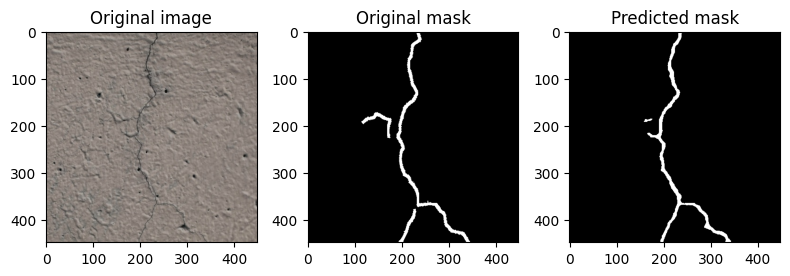

Epoch 2/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414], 'dice': [0.37517397357271864, 0.6327786828790393], 'iou': [0.3233720451206356, 0.5127863407909096], 'precision': [0.449066502320302, 0.7969918173628968], 'recall': [0.8206877944531379, 0.5987703029985552], 'f1_score': [0.37517397357271864, 0.6327786848142549]}
training_loss: 0.09066
training_iou: 0.51279
training_dice: 0.63278
{'loss': [0.1161993729371217, 0.10819584804196511], 'dice': [0.6454019373463046, 0.7100943983081849], 'iou': [0.5280730244252951, 0.5941033360037592], 'precision': [0.7869245996398311, 0.7958967358835282], 'recall': [0.6226914741339222, 0.6912276937115577], 'f1_score': [0.6454019402304003, 0.7100944064797894]}
Validation loss: 0.1082
Validation iou: 0.5941
Validation dice: 0.7101
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


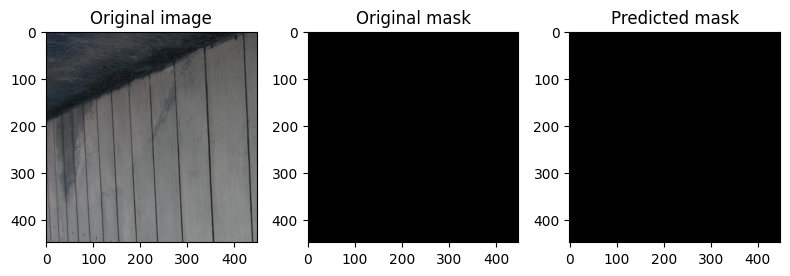

Epoch 3/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635]}
training_loss: 0.08612
training_iou: 0.54376
training_dice: 0.66283
{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521], 'dice': [0.6454019373463046, 0.7100943983081849, 0.7127682230315141], 'iou': [0.5280730244252951, 0.5941033360037592, 0.5983645504701042], 'precision': [0.7869245996398311, 0.7958967358835282, 0.7918221338449286], 'recall': [0.6226914741339222, 0.6912276937115577, 0.7090501689141796], 'f1_score': [0.6454019402304003, 0.7100944064797894, 0.7127682259156098]}
Validation loss: 0.1066
Validation iou: 0.5984
Validation dice: 0

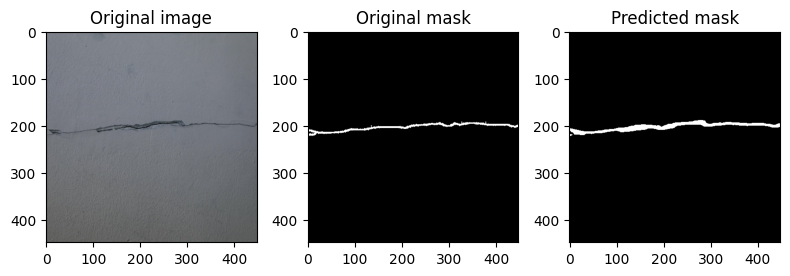

Epoch 4/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635, 0.6884466665131705]}
training_loss: 0.08264
training_iou: 0.56729
training_dice: 0.68845
{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521, 0.10692425991498655], 'dice': [0.6454019373463046, 0.7100943983081849, 0.7127682230315141, 0.7203120948266117], 'iou': [0.5280730244252951, 0.5941033360037592, 0.5983645504701042, 0.6066840152075935], 'precision': [0.7869245996398311, 0.7958967358835282, 0.7918221338449286, 0.7799964535440649], 'recall': 

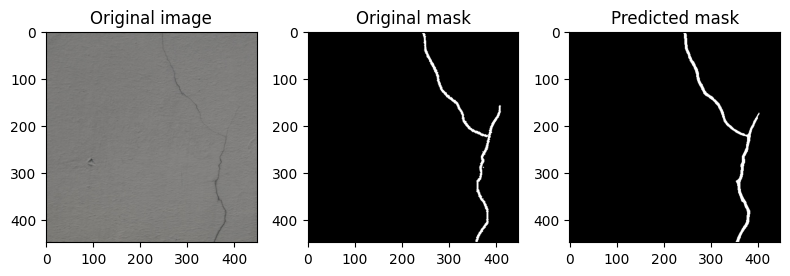

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6066840152075935epoch50.pth
Epoch 5/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635, 0.6884466665131705, 0.6924254607844662]}
training_loss: 0.08240
training_iou: 0.57338
training_dice: 0.69243
{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521, 0.10692425991498655, 0.10438839760759185], 'dice': [0.6454019373463046, 0.7100943983081849, 0.7127682230315141, 0.7203120948266117, 0.7328885000259164], 'iou': [0.5280730244252951, 0.594

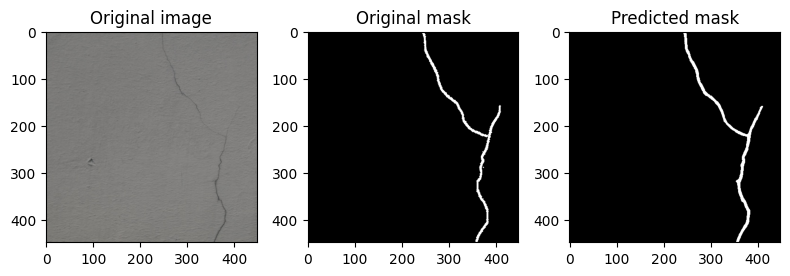

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6188958317394399epoch50.pth
Epoch 6/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355, 0.6825828072312591], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635, 0.6884466665131705, 0.6924254607844662, 0.701225331077328]}
training_loss: 0.07868
training_iou: 0.58358
training_dice: 0.70123
{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521, 0.10692425991498655, 0.10438839760759185, 0.10559743378431566], 'd

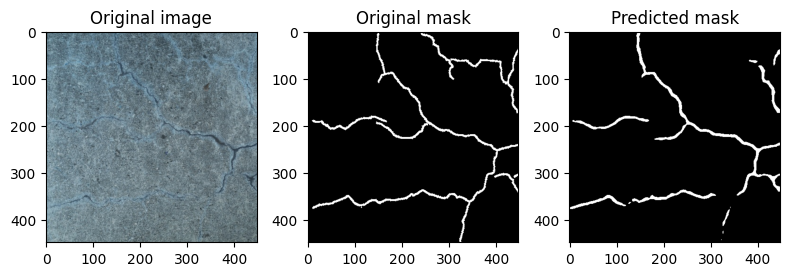

Epoch 7/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355, 0.6825828072312591, 0.6656774290196308], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635, 0.6884466665131705, 0.6924254607844662, 0.701225331077328, 0.687209087145793]}
training_loss: 0.08060
training_iou: 0.56967
training_dice: 0.68721
{'loss': [0.1161993

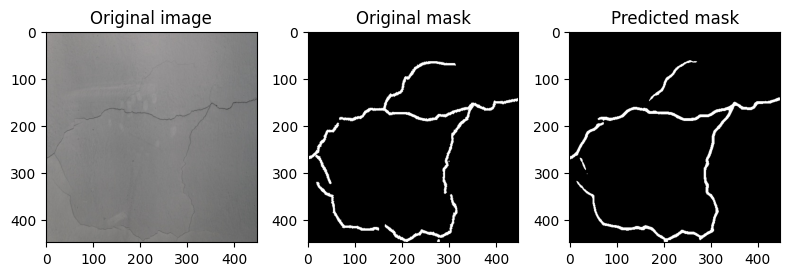

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6263197397286515epoch50.pth
Epoch 8/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355, 0.6825828072312591, 0.6656774290196308, 0.6916529505283802], 'f1_score': [0.37517397357271864, 0.6327786848142549, 0.6628329053327635, 0.6884466665131705, 0.6924254607844662, 0.701225331077328, 0.687209

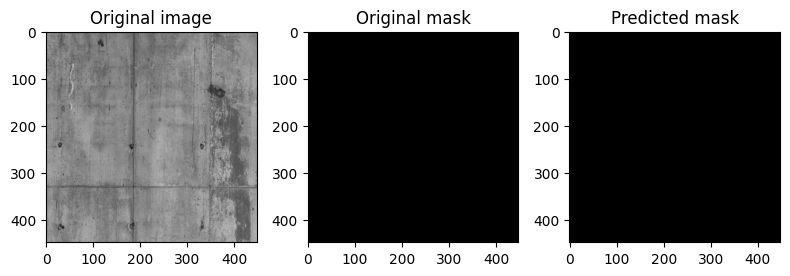

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6336466208205468epoch50.pth
Epoch 9/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041, 0.7935282680895421], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355, 0.6825828072312591, 0.6656774290196308, 0.6916529505283802, 0.6768572690424981], 'f1_score': [0.37517397357271864, 0.63277

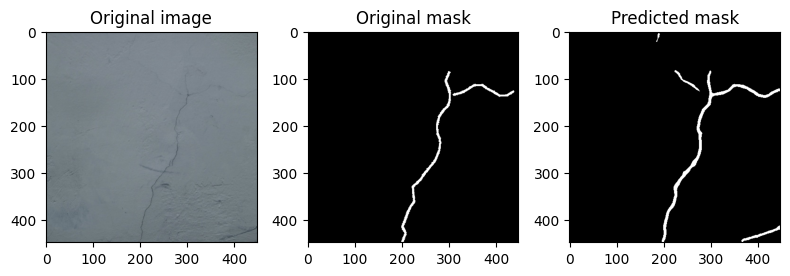

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6342523455049002epoch50.pth
Epoch 10/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041, 0.7935282680895421, 0.7921239284725933], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0.6555275112003475, 0.6667161645827355, 0.6825828072312591, 0.6656774290196308, 0

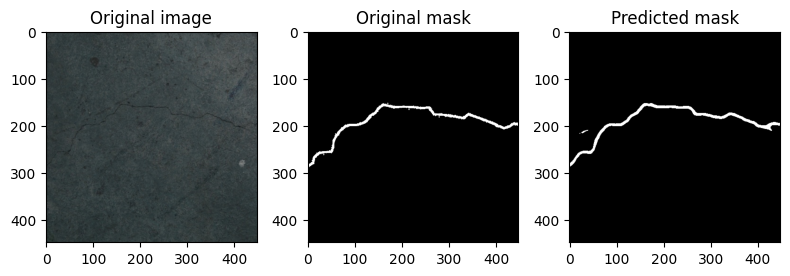

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6365363714435408epoch50.pth
Epoch 11/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041, 0.7935282680895421, 0.7921239284725933, 0.8007585421785132], 'recall': [0.8206877944531379, 0.5987703029985552, 0.6398523449897766, 0

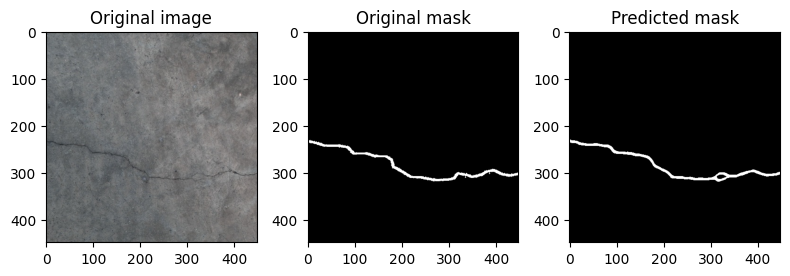

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6385255618802002epoch50.pth
Epoch 12/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041, 0.7935282680895421, 0.7921239284725933, 0.8007585421785132, 0.80392337464

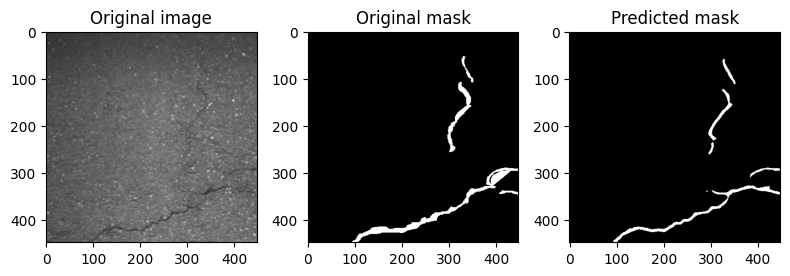

Epoch 13/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.6156292774460532], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.7929180256732098, 0.7958019608026975, 0.8090674126303041, 0.79352826808

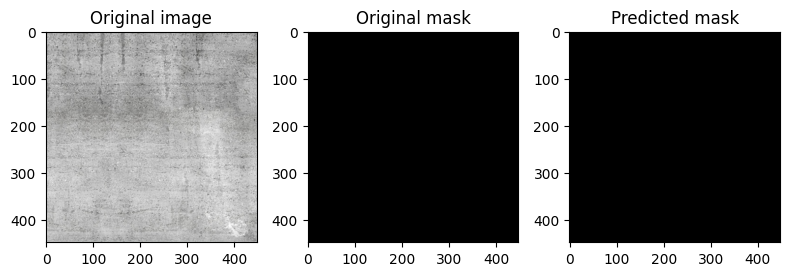

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6392971982939109epoch50.pth
Epoch 14/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.6156292774460532, 0.6014607889311654], 'precision': [0.449066502320302, 0.7969918173628968, 0.7850288950003587, 0.7995423519766176, 0.7963390373564386, 0.792918025673

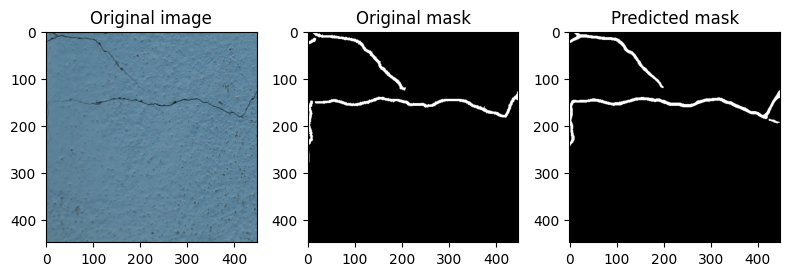

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6404285684318072epoch50.pth
Epoch 15/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.6156292774460532, 0.6014607889311654, 0.6126504915875274], 'precision': [0.449066502320302, 0.7969918173628968, 0.785028895000

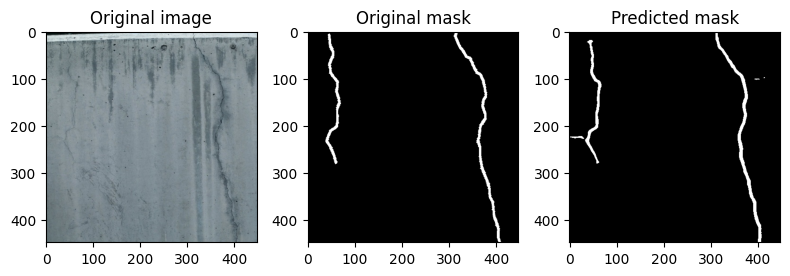

Epoch 16/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.6156292774460532, 0.6014607889311654, 0.6126504915875274, 0.6141391005608943], 'preci

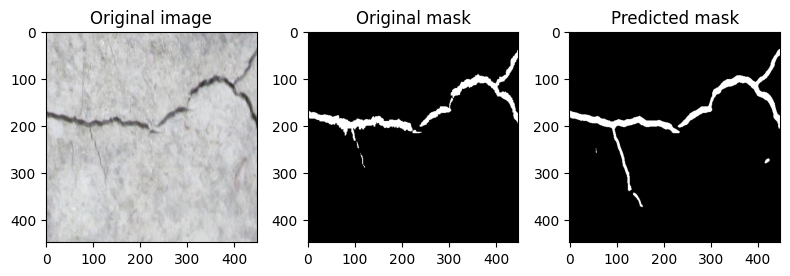

Epoch 17/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.6156292774460532, 0.6014607889311654, 0.6126

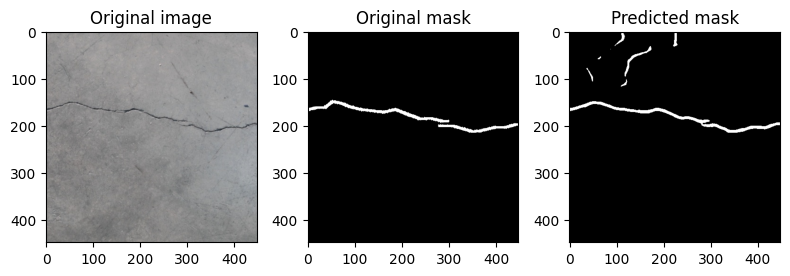

Epoch 18/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6061735350590247, 0.601630127662188, 0.615

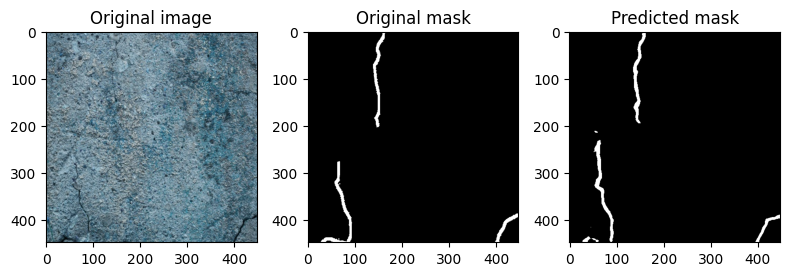

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6411011919018722epoch50.pth
Epoch 19/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.5828928811983629, 0.5897286027282863, 0.6

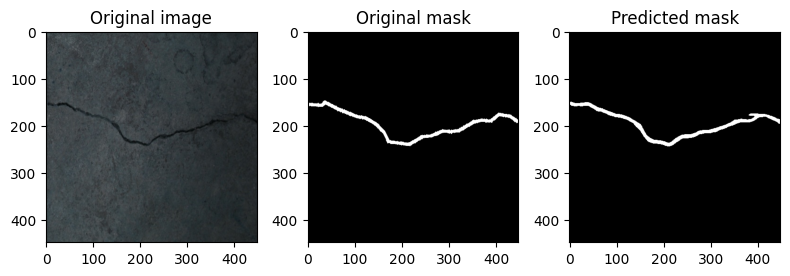

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6498898672683525epoch50.pth
Epoch 20/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 0.5696677457202565, 0.602279879056014, 0.

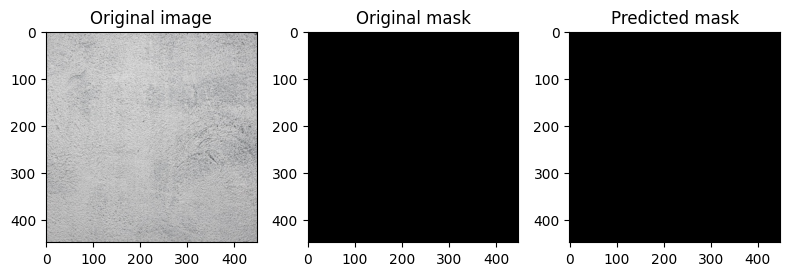

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6507033769214046epoch50.pth
Epoch 21/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046, 0.5733819615531277, 0.5835840183419067, 

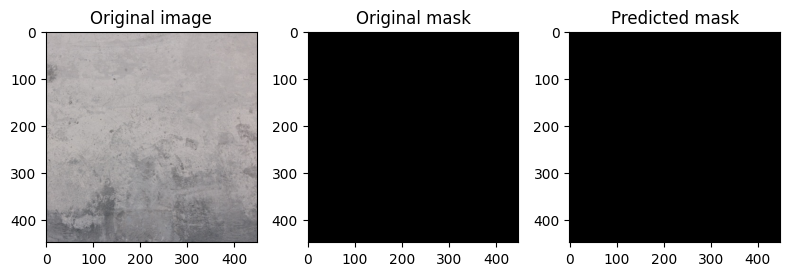

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6530675923624527epoch50.pth
Epoch 22/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7448953893277552], 'iou': [0.3233720451206356, 0.5127863407909096, 0.5437552464472784, 0.5672946556822046,

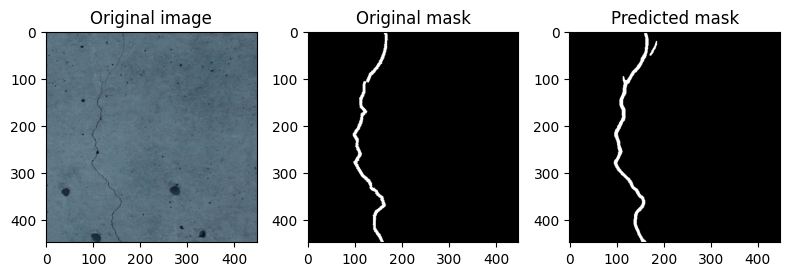

Epoch 23/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7448953893277552, 0.7473034293620617], 'iou': [0.3233720451206356, 0.5127863407909096

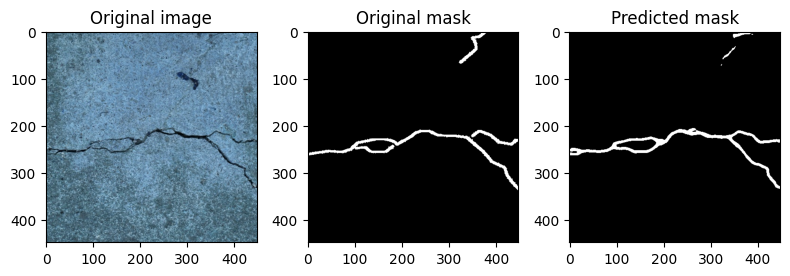

Epoch 24/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7448953893277552, 0.7473034293620617, 0.7416259360003781], 'iou'

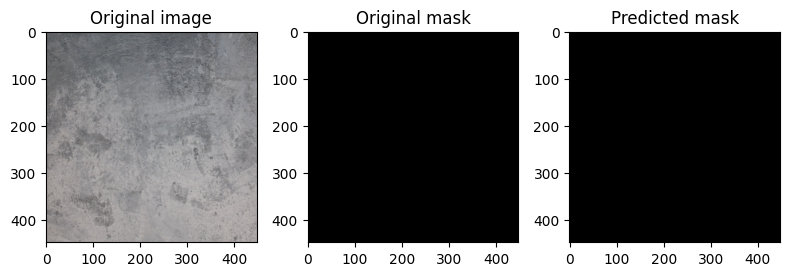

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6540698504916602epoch50.pth
Epoch 25/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7448953893277552, 0.7473034293620617, 0.741

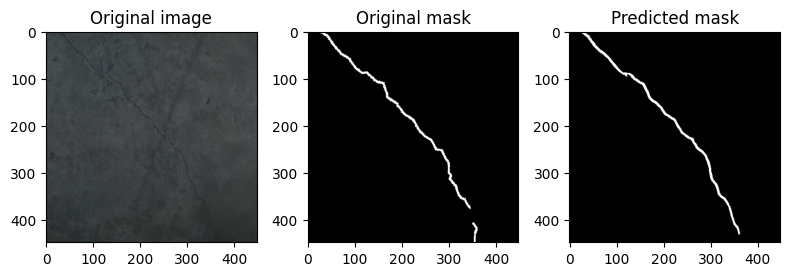

Epoch 26/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7448953893277552, 0.74

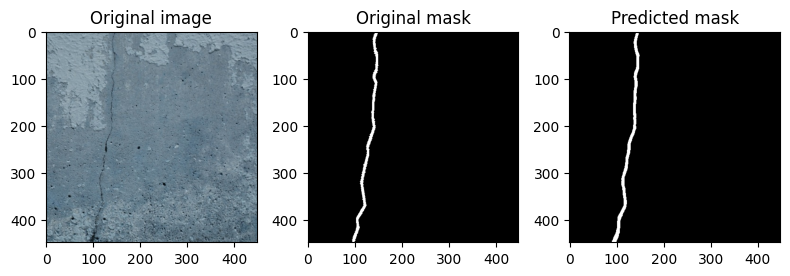

Epoch 27/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.7459200620651245, 0.7

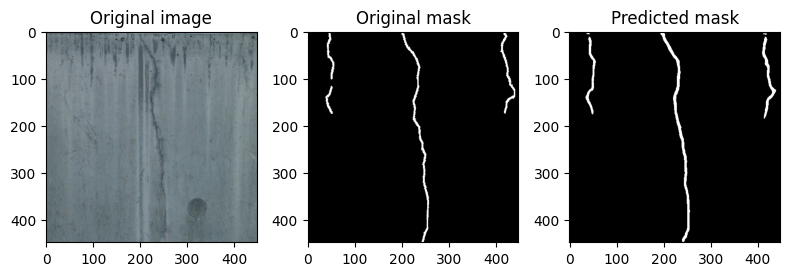

Epoch 28/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0.7411861017152861, 0.

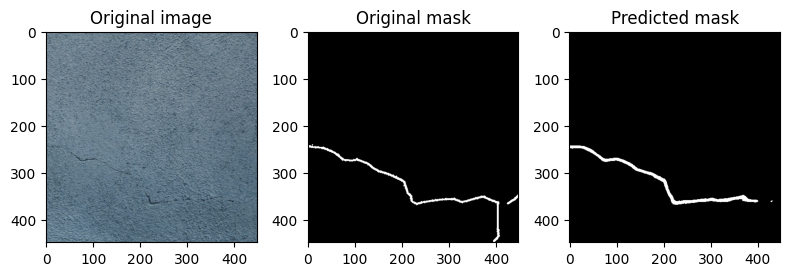

Epoch 29/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 0.7406037929770234, 0

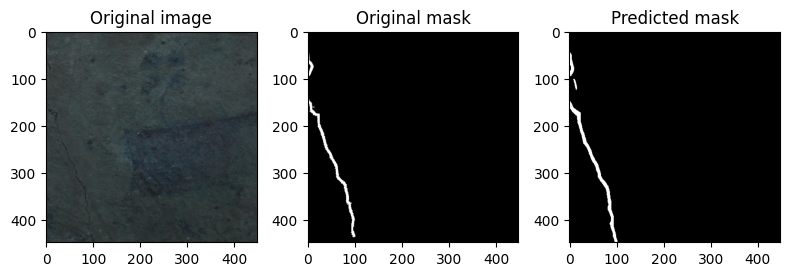

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6548257091593358epoch50.pth
Epoch 30/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119, 0.7162854021245783, 

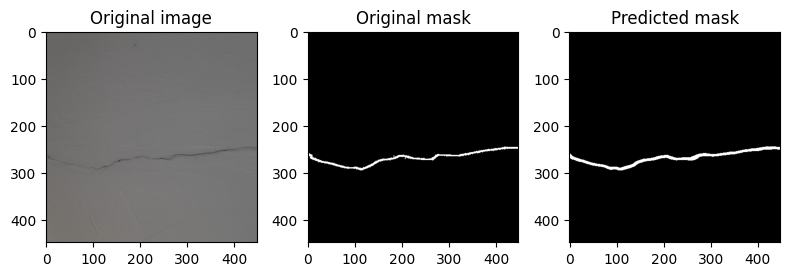

Epoch 31/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305, 0.7286231440383119,

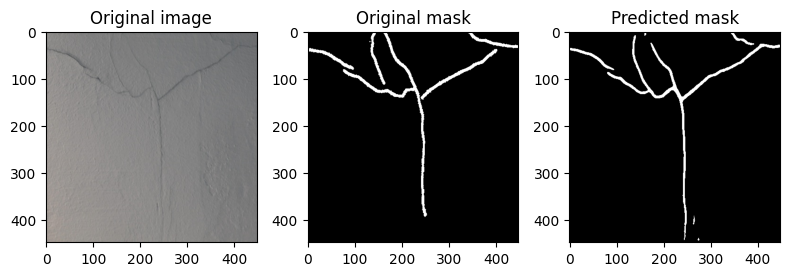

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6553907970627469epoch50.pth
Epoch 32/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.727361379505752, 0.7305397050721305

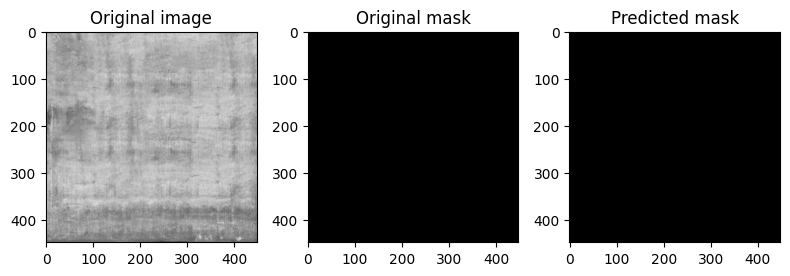

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6571971432816598epoch50.pth
Epoch 33/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679077, 0.72736137950575

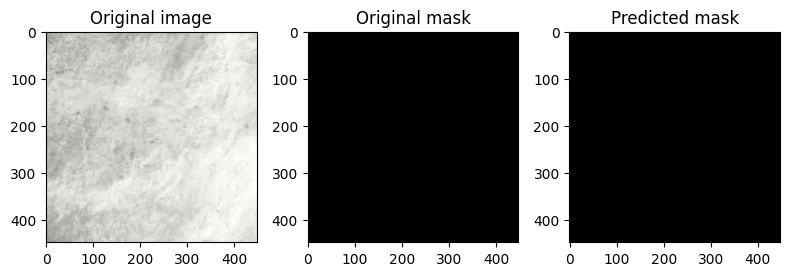

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6573393667236932epoch50.pth
Epoch 34/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.7330980478943169, 0.7175086736679

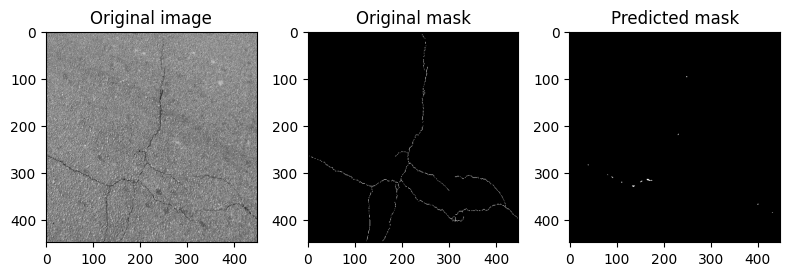

Epoch 35/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.7179696761168443, 0.733098047894

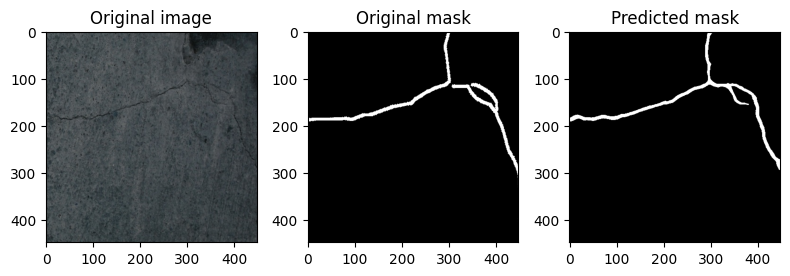

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6575162561024509epoch50.pth
Epoch 36/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892421871, 0.71796967611

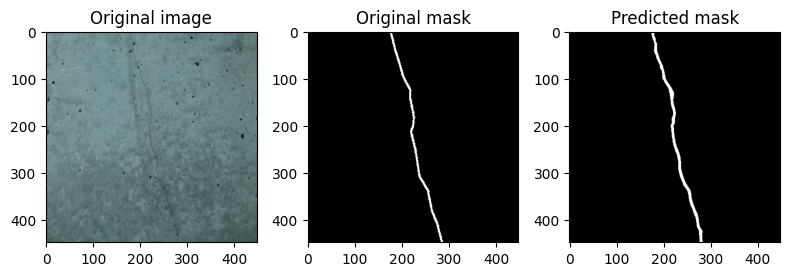

Epoch 37/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.7086856171682283, 0.724547892

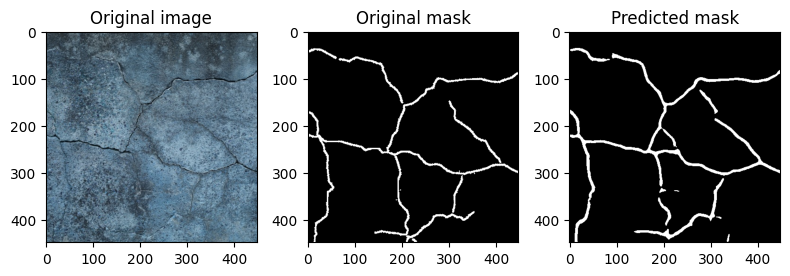

Epoch 38/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556357903914, 0.70868561

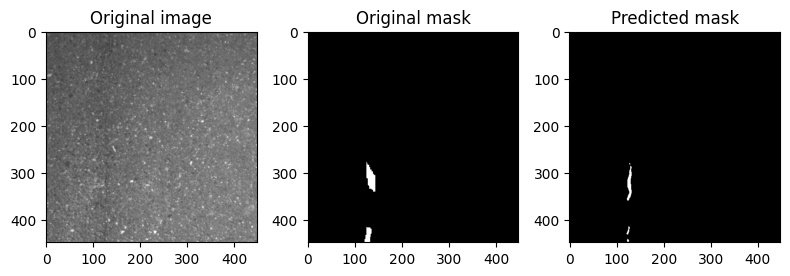

Model saved after best val  epochs to Dplinknetdataaugbcedice0.658987614686691epoch50.pth
Epoch 39/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.7184288230809298, 0.6996556

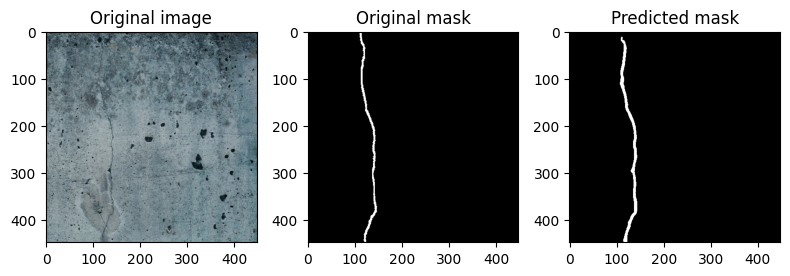

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6590406208960039epoch50.pth
Epoch 40/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.6872090770826711, 0.718428

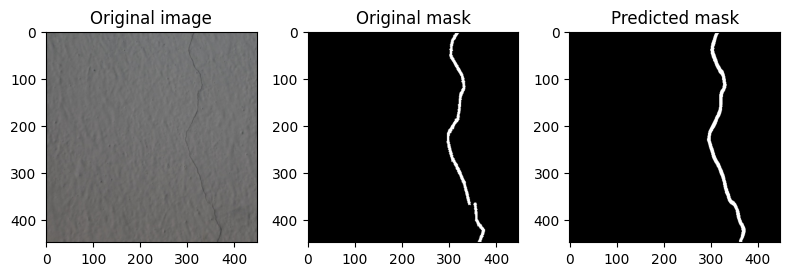

Epoch 41/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012253303032416, 0.68720

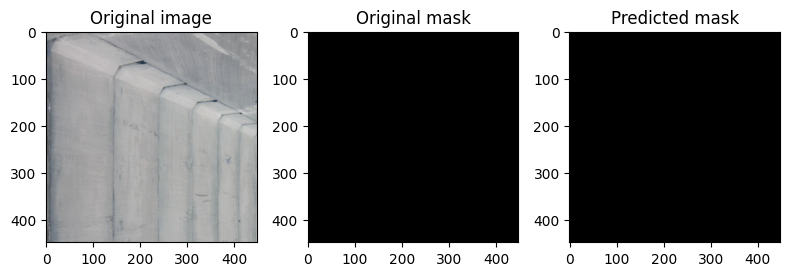

Epoch 42/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.6924254638808114, 0.7012

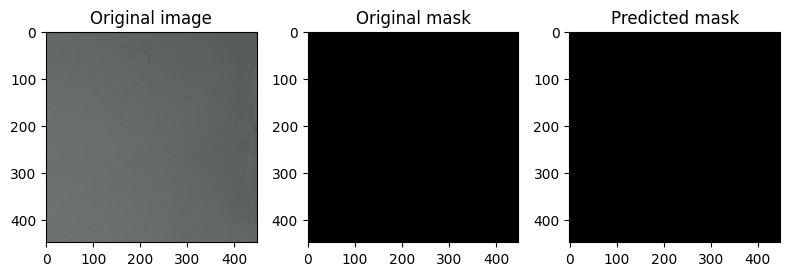

Epoch 43/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.688446664964998, 0.692

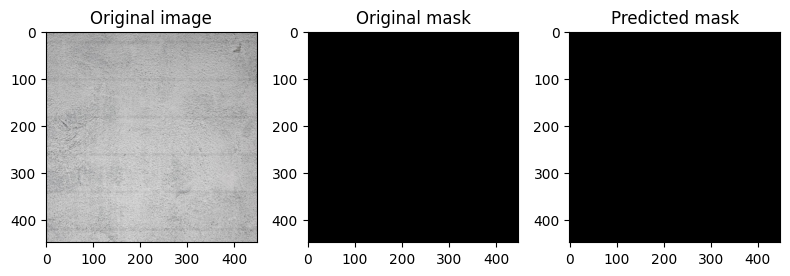

Epoch 44/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6628329053327635, 0.6

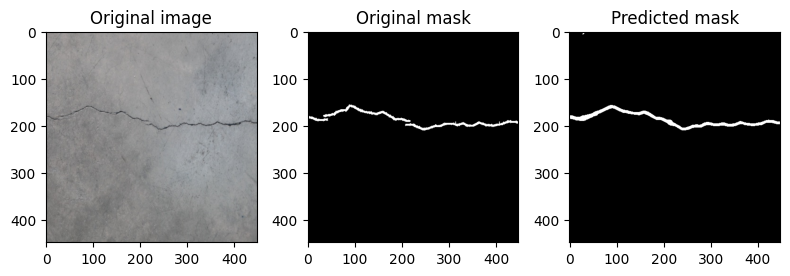

Epoch 45/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451], 'dice': [0.37517397357271864, 0.6327786828790393, 0.6

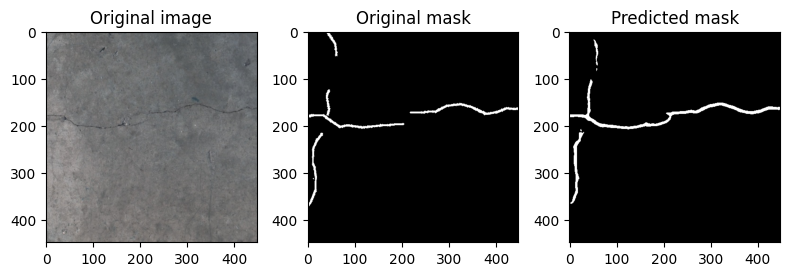

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6598790537626031epoch50.pth
Epoch 46/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305], 'dice': [0.37517397357271864, 0.

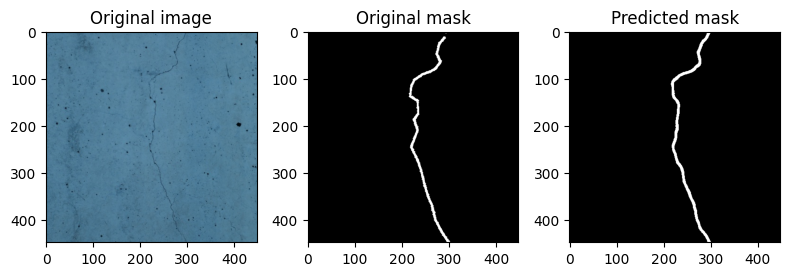

Epoch 47/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625], 'dice': [0.

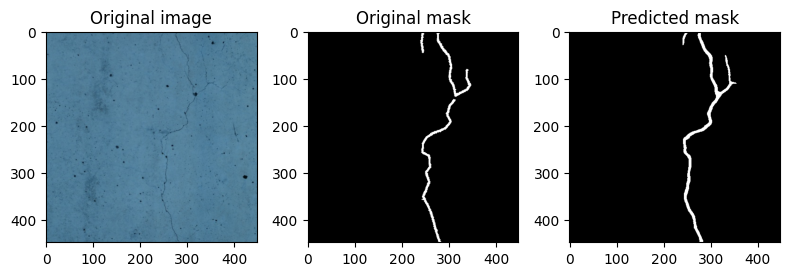

Epoch 48/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

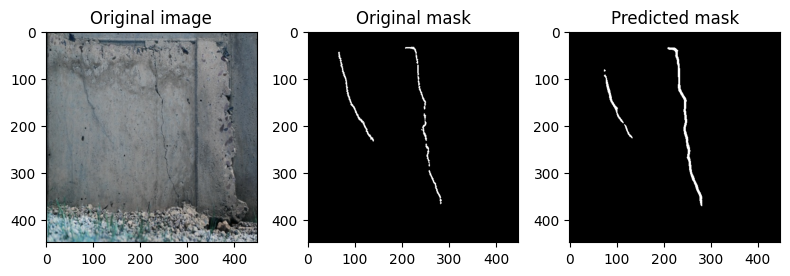

Epoch 49/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

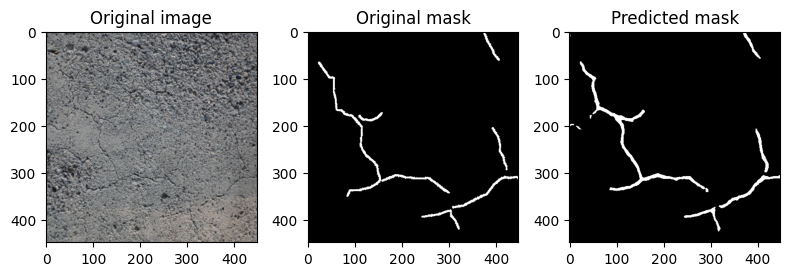

Epoch 50/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

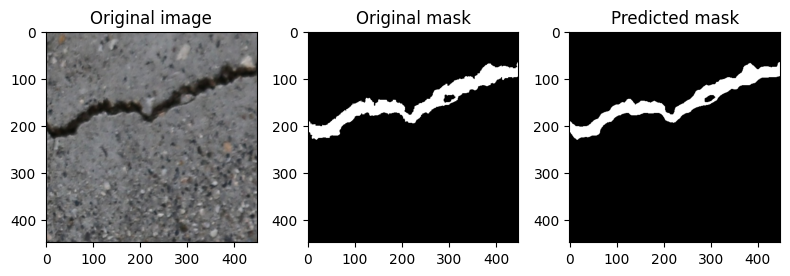

Epoch 51/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

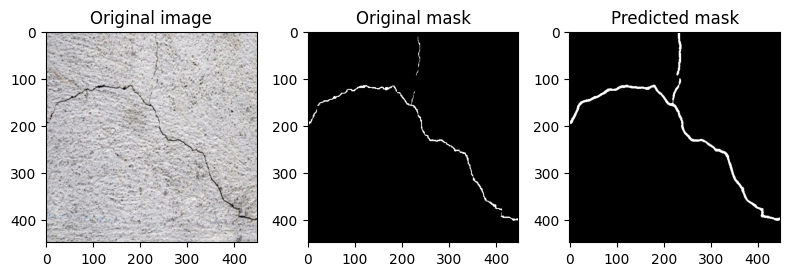

Epoch 52/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

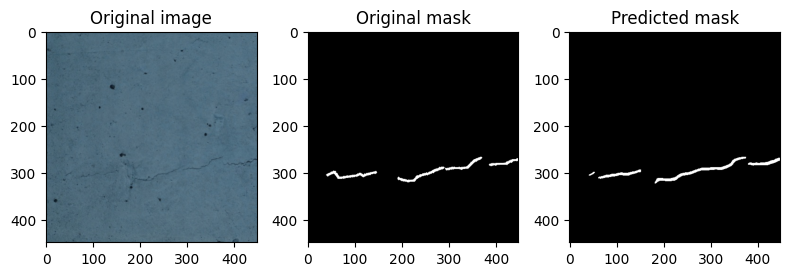

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6600988559244622epoch50.pth
Epoch 53/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

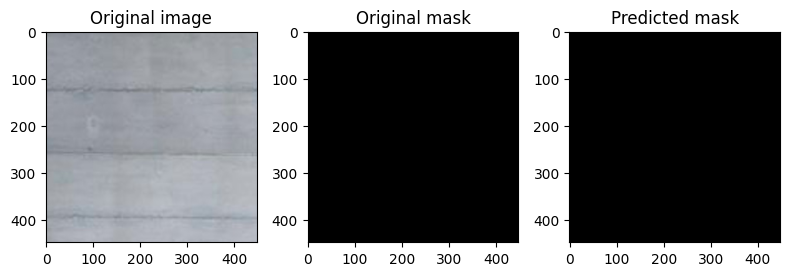

Epoch 54/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

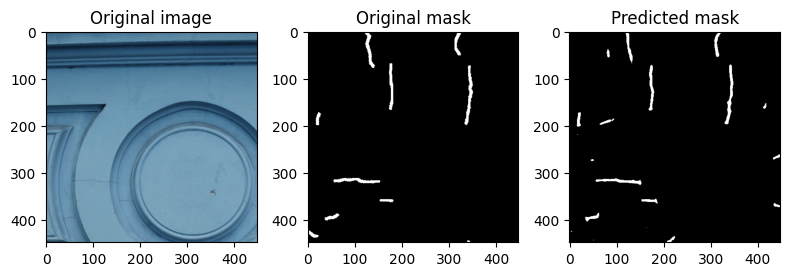

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6606112001764197epoch50.pth
Epoch 55/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

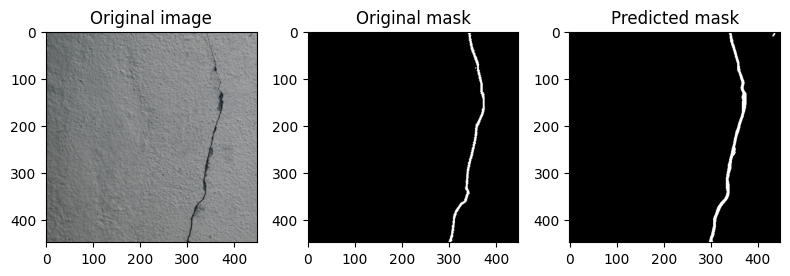

Epoch 56/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

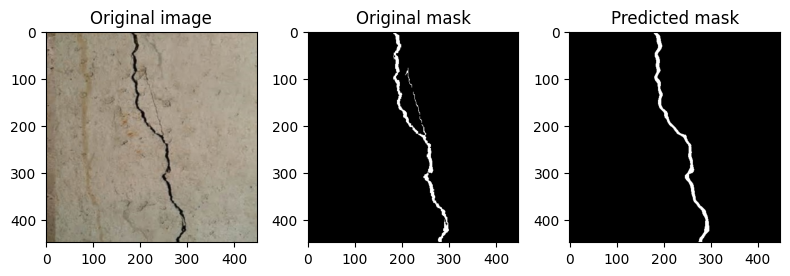

Epoch 57/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

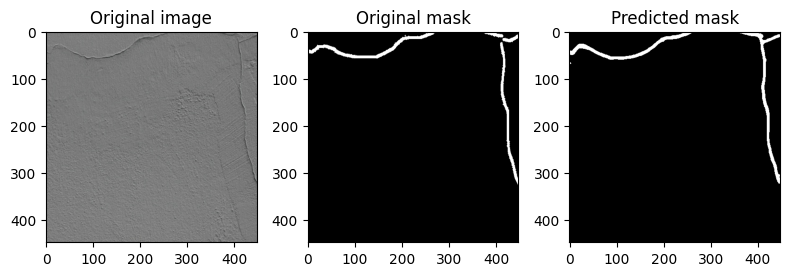

Epoch 58/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

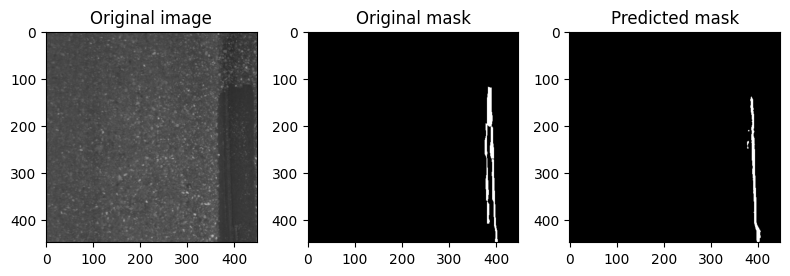

Epoch 59/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

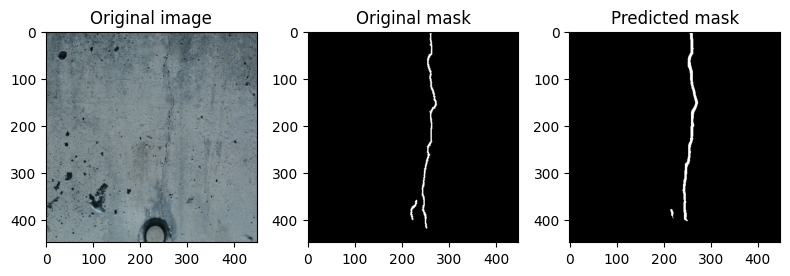

Epoch 60/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

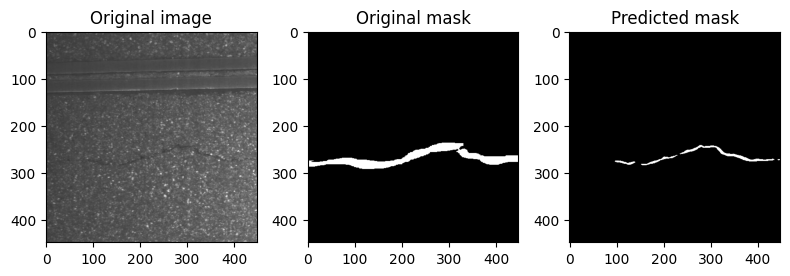

Epoch 61/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

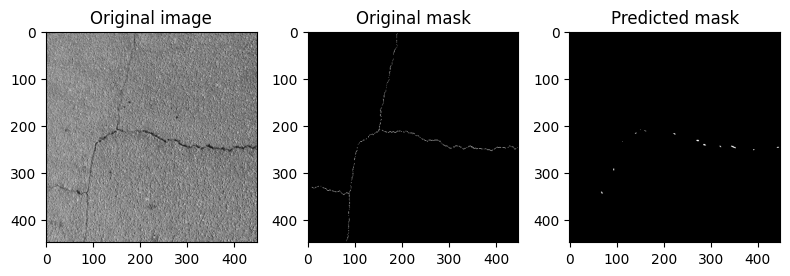

Epoch 62/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

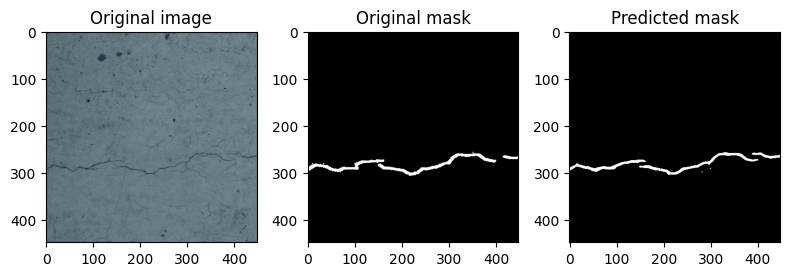

Model saved after best val  epochs to Dplinknetdataaugbcedice0.6606251422856604epoch50.pth
Epoch 63/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

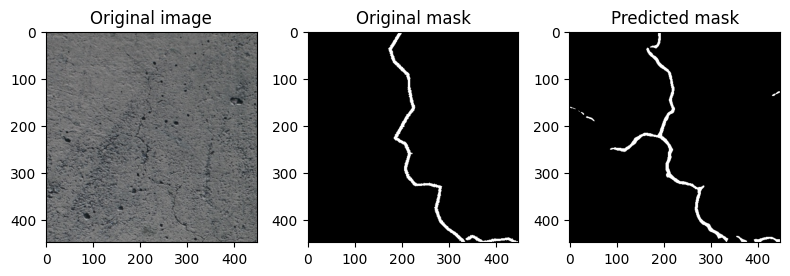

Epoch 64/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

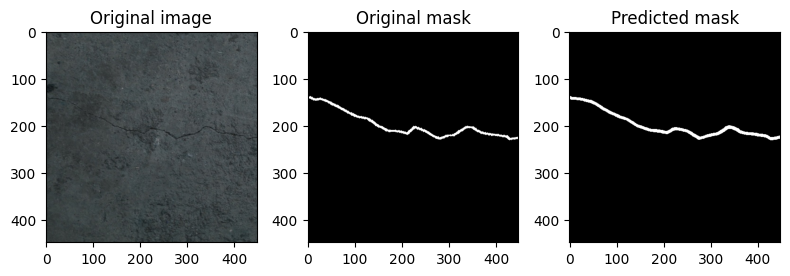

Epoch 65/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

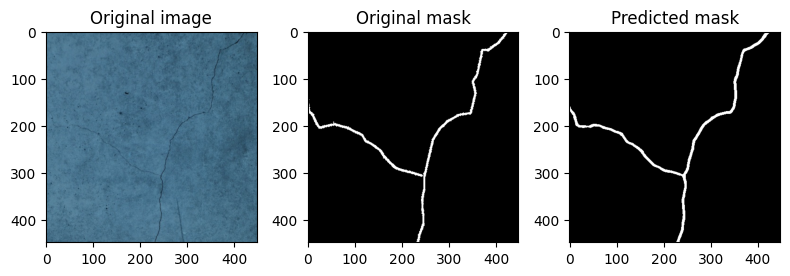

Model saved after best val  epochs to Dplinknetdataaugbcedice0.661106462620439epoch50.pth
Epoch 66/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

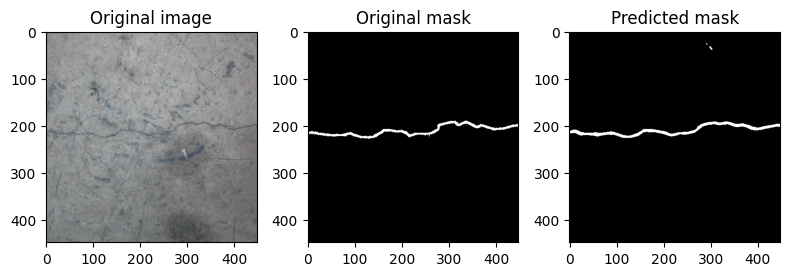

Epoch 67/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

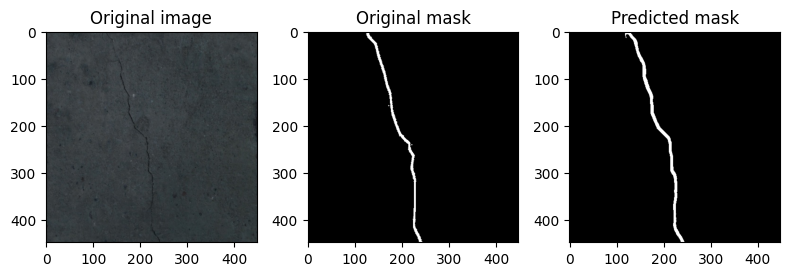

Epoch 68/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

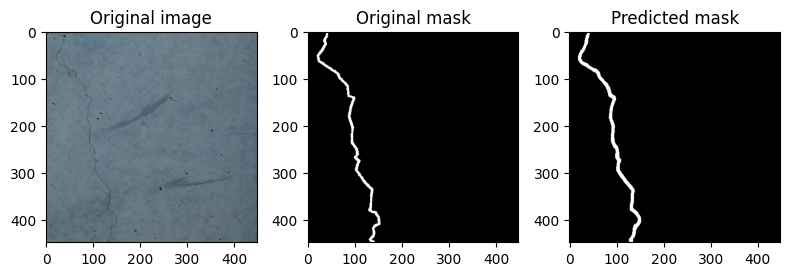

Epoch 69/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

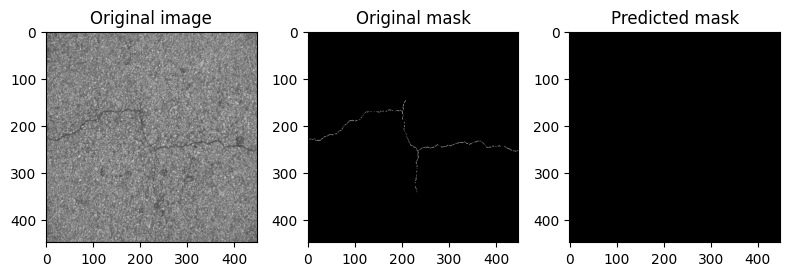

Epoch 70/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

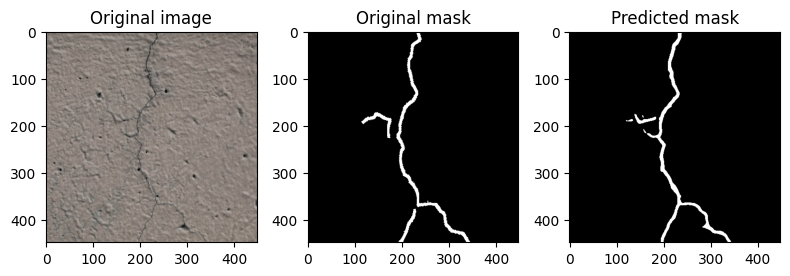

Epoch 71/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

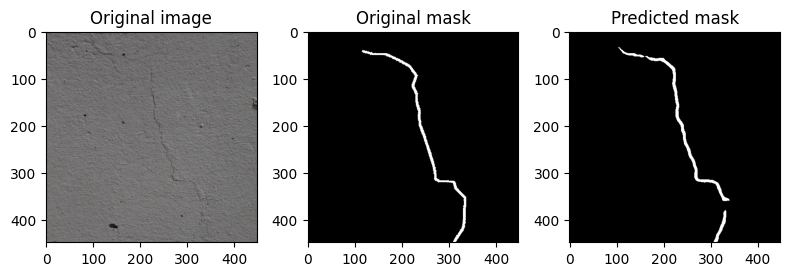

Epoch 72/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

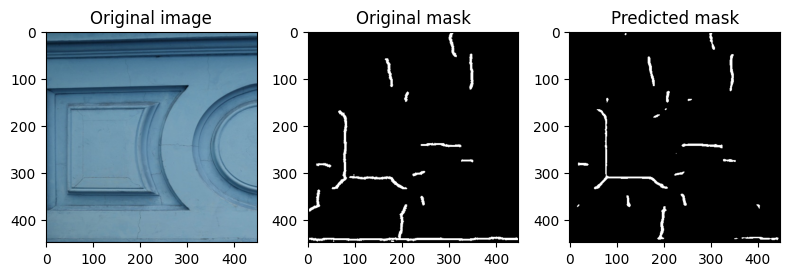

Epoch 73/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

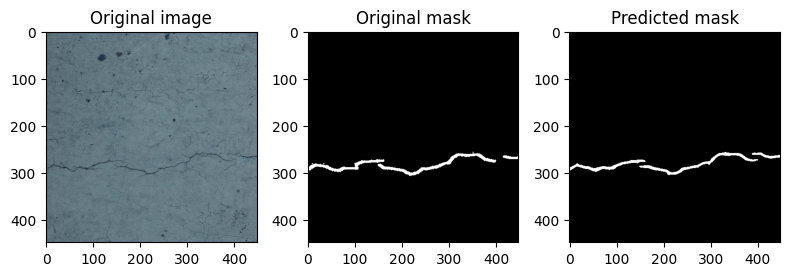

Epoch 74/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

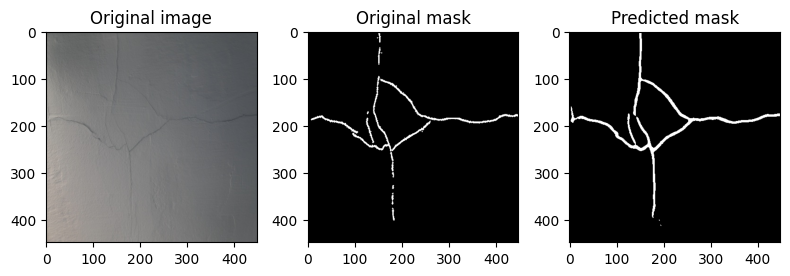

Epoch 75/75


  0%|          | 0/385 [00:00<?, ?it/s]

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

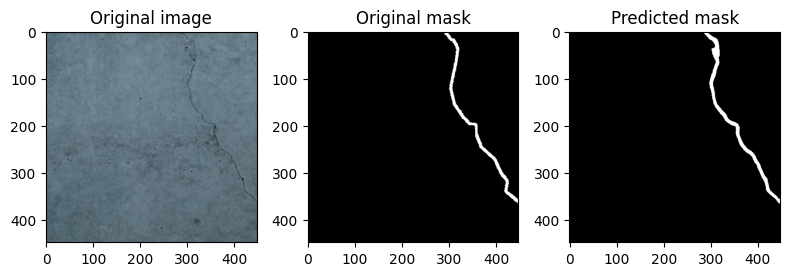

In [109]:
model=model.to(device)
# criterion= torchvision.ops.sigmoid_focal_loss
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
early = EarlyStopping()


# Loss function and optimizer
criterion = DiceBCELoss()
best_model_val=0.60

# Define dictionaries to store per-epoch average loss and metrics
training_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

validation_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

# Training loop
for epoch in range(epochs):
    
    model.train()
    running_loss = 0.0
    running_500_loss=0.0
    epoch_loss = 0.0
    training_metrics_epoch = {
        'loss': [],
        'dice': [],
        'iou': [],
        'precision': [],
        'recall': [],
        'f1_score': [],
    }
    print(f'Epoch {epoch + 1}/{epochs}')
    for batch_idx, (inputs, targets) in enumerate(tqdm(train_dataloader, leave=False)):
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        epoch_loss += loss.item()
        running_500_loss+=loss.item()

        # Calculate metrics for training after every 10th batch
        if (batch_idx +1 )% 500 == 0:
            
            random_number = np.random.randint(1, len(df_valid) + 1)
            
            print("train_data visualize: loss: ",running_500_loss/500)
            validate_test_image(model, df_train,random_number)
            print("valid_data visualize: ")
            validate_test_image(model, df_valid,random_number)
            running_500_loss=0.0
        if (batch_idx + 1) % 5 == 0:
            avg_loss = running_loss / 5  # Average loss for the last 10 batches
            running_loss = 0.0  # Reset the running loss

            # Calculate and store training metrics using find_metrics
            metrics = find_metrics(outputs, targets)  # Adjust threshold if needed
            training_metrics_epoch['loss'].append(avg_loss)
            training_metrics_epoch['dice'].append(metrics['dice'].cpu().item())
            training_metrics_epoch['iou'].append(metrics['iou'].cpu().item())
            training_metrics_epoch['precision'].append(metrics['precision'].cpu().item())
            training_metrics_epoch['recall'].append(metrics['recall'].cpu().item())
            training_metrics_epoch['f1_score'].append(metrics['f1_score'].cpu().item())
            
            
            
            

        
            

    # Calculate the average metrics for this epoch's training batches
    for key, value in training_metrics_epoch.items():
        if value:
            training_metrics[key].append(np.mean(value))
    print(training_metrics)
    
    # Calculate and store the average loss for this epoch
#     training_metrics['loss'].append(epoch_loss / len(train_dataloader))
    print(f"training_loss: {epoch_loss / len(train_dataloader):.5f}")
    print(f"training_iou: {training_metrics['iou'][-1]:.5f}")
    print(f"training_dice: {training_metrics['dice'][-1]:.5f}")
    # Calculate validation metrics every 5 epochs
    avg_loss=0.0
    if (epoch + 1) % 1 == 0:
        model.eval()
        validation_loss = 0.0
        validation_metrics_epoch = {
            'loss': [],
            'dice': [],
            'iou': [],
            'precision': [],
            'recall': [],
            'f1_score': [],
        }

        for val_inputs, val_targets in valid_dataloader:
            val_inputs = val_inputs.to(device)
            val_targets = val_targets.to(device)

            val_outputs = model(val_inputs)
            val_loss = criterion(val_outputs, val_targets)
            validation_loss += val_loss.item()

            # Calculate and store validation metrics using find_metrics
            val_metrics = find_metrics(val_outputs, val_targets)  # Adjust threshold if needed
            validation_metrics_epoch['loss'].append(val_loss.item())
            validation_metrics_epoch['dice'].append(val_metrics['dice'].cpu().item())
            validation_metrics_epoch['iou'].append(val_metrics['iou'].cpu().item())
            validation_metrics_epoch['precision'].append(val_metrics['precision'].cpu().item())
            validation_metrics_epoch['recall'].append(val_metrics['recall'].cpu().item())
            validation_metrics_epoch['f1_score'].append(val_metrics['f1_score'].cpu().item())
            
            
            

           

        avg_validation_loss = validation_loss / len(valid_dataloader)
        avg_loss=avg_validation_loss


        # Calculate the average metrics for this epoch's validation batches
        for key, value in validation_metrics_epoch.items():
            if value:
                validation_metrics[key].append(np.mean(value))

        # Store the average loss for this epoch
#         validation_metrics['loss'].append(avg_validation_loss)

        print(validation_metrics)
        print(f'Validation loss: {avg_validation_loss:.4f}')
        print(f'Validation iou: {validation_metrics["iou"][-1]:.4f}')
        print(f'Validation dice: {validation_metrics["dice"][-1]:.4f}')
        scheduler.step(avg_loss)
#         early(avg_loss, model=model)
#         if early.early_stop:
#             print(f'Validation loss did not improve for {early.patience} epochs. Training stopped.')
#             model.load_state_dict(torch.load(path))
#             break
        #         print("training_loss",validaion_metrics['loss'][epoch])
#         print("validation_iou",validation_metrics['iou'][epoch])
#         print("validation_dice",validation_metrics['dice'][epoch])

    if (epoch + 1) % 1 == 0:
        
            validate_test_image(model, df_valid)

    if validation_metrics['iou'][-1] >= best_model_val:
        best_model_val = validation_metrics['iou'][-1]
    # Define the path where you want to save the model
        model_path = "Dplinknetdataaugbcedice"+str(validation_metrics['iou'][-1])+"epoch50"+".pth"

        # Save the model's state_dict
        torch.save(model.state_dict(), model_path)

        print(f'Model saved after best val  epochs to {model_path}')
    torch.cuda.empty_cache()   

# Scheduler step (if using a learning rate scheduler)
 # Step based on the last validation loss


In [110]:
len(valid_dataloader)

62

In [111]:
model_path_new='DPFinal_linknet_bcedice_dataaug_100_tr.pth'

In [112]:
validation_metrics

{'loss': [0.1161993729371217,
  0.10819584804196511,
  0.10664082985491521,
  0.10692425991498655,
  0.10438839760759185,
  0.10559743378431566,
  0.10313549415478783,
  0.1009503802765281,
  0.10117048887355674,
  0.10045861572988572,
  0.10124705891094861,
  0.10090547325390001,
  0.09989136679758949,
  0.09872094797150742,
  0.09966251082838543,
  0.10026496342353282,
  0.10180148806783461,
  0.09909878475891967,
  0.09718442867479977,
  0.0968926822646491,
  0.09658493008464575,
  0.09611616890516973,
  0.0960216878823215,
  0.09533056748970863,
  0.095695391868151,
  0.09549823781896022,
  0.09521142252150082,
  0.09539315468000789,
  0.09535594747191475,
  0.0956348747675938,
  0.09505230708107833,
  0.09503236431027612,
  0.09482211460389438,
  0.09492541359917771,
  0.09398163254222562,
  0.094242952163181,
  0.09469243923142072,
  0.09479203174311307,
  0.09430645820834944,
  0.09424068742702084,
  0.09418148108788076,
  0.09434170131721804,
  0.09392761553247128,
  0.09431769

In [113]:
torch.save(model.state_dict(),model_path_new )

In [114]:
def save_model(epochs, model, optimizer, criterion):
    """
    Function to save the trained model to disk.
    """
    print(f"Saving final model...")
    torch.save({
                'epoch': epochs,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': criterion,
                }, 'linknet_optimizer_lossstate.pth')

In [115]:
criterion,optimizer,epochs

(DiceBCELoss(),
 Adam (
 Parameter Group 0
     amsgrad: False
     betas: (0.9, 0.999)
     capturable: False
     differentiable: False
     eps: 1e-08
     foreach: None
     fused: None
     lr: 1.0000000000000002e-06
     maximize: False
     weight_decay: 0
 ),
 75)

In [116]:
save_model(epochs, model, optimizer, criterion)

Saving final model...


In [117]:
# os.listdir('/kaggle/working/')

In [118]:
import torch

allocated_memory = torch.cuda.memory_allocated()
cached_memory = torch.cuda.memory_cached()

print(f'Allocated GPU memory: {allocated_memory / (1024**2):.2f} MB')
print(f'Cached GPU memory: {cached_memory / (1024**2):.2f} MB')



Allocated GPU memory: 5162.60 MB
Cached GPU memory: 8342.00 MB


In [119]:
torch.cuda.empty_cache()

In [120]:
print(training_metrics)

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

In [121]:
print(validation_metrics)

{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521, 0.10692425991498655, 0.10438839760759185, 0.10559743378431566, 0.10313549415478783, 0.1009503802765281, 0.10117048887355674, 0.10045861572988572, 0.10124705891094861, 0.10090547325390001, 0.09989136679758949, 0.09872094797150742, 0.09966251082838543, 0.10026496342353282, 0.10180148806783461, 0.09909878475891967, 0.09718442867479977, 0.0968926822646491, 0.09658493008464575, 0.09611616890516973, 0.0960216878823215, 0.09533056748970863, 0.095695391868151, 0.09549823781896022, 0.09521142252150082, 0.09539315468000789, 0.09535594747191475, 0.0956348747675938, 0.09505230708107833, 0.09503236431027612, 0.09482211460389438, 0.09492541359917771, 0.09398163254222562, 0.094242952163181, 0.09469243923142072, 0.09479203174311307, 0.09430645820834944, 0.09424068742702084, 0.09418148108788076, 0.09434170131721804, 0.09392761553247128, 0.09431769852075846, 0.09399089160104913, 0.09350088917680326, 0.09392572302491434, 0.0939076713

In [122]:
# masks=test[1]
# threshold=0.6
# outputs_pred = torch.sigmoid(output[0])
# y_pred = (outputs_pred > threshold).float()

# intersection = torch.logical_and(y_pred, masks)
# union = torch.logical_or(y_pred, masks)

# iou1= (torch.sum(intersection)+1e-15) / (torch.sum(union) + 1e-15)
# dice1 = (2 * torch.sum(intersection)+1e-15)/ (torch.sum(y_pred) + torch.sum(masks) + 1e-15)
# # precision1 = (torch.sum(intersection)+1e-15) / (torch.sum(y_pred) + 1e-15)
# # recall1 = (torch.sum(intersection)+1e-5) / (torch.sum(masks) + 1e-15)
# precision1=precision_tesnor(y_pred,masks)
# recall1=recall_tensor(y_pred,masks)
# f11 = (2 * precision1* recall1) / (precision1 + recall1)

In [123]:
# metrics=None
# model=model.to(device)
# for i in train_dataloader:
#     model.eval()
#     inputs,masks=i
#     inputs=inputs.to(device)
#     masks=masks.to(device)
#     outputs=model(inputs)
#     metrics=find_metrics(outputs,masks)
#     break
    
# # model = model.to(device)



In [124]:
# metrics['dice'].cpu().item()

In [125]:
# outputs=None
# predicted=None
# for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
#             model.eval()
#             inputs = batch[0]
#             targets = batch[1]

#             outputs = model(inputs)
#             _, predicted = torch.max(outputs, 1)
#             break

In [126]:
# outputs.shape

In [127]:
# predicted.shape

In [128]:
# accuracy_score(y_true,y_pred)

In [129]:
# torch.save()

In [130]:
print(validation_metrics)

{'loss': [0.1161993729371217, 0.10819584804196511, 0.10664082985491521, 0.10692425991498655, 0.10438839760759185, 0.10559743378431566, 0.10313549415478783, 0.1009503802765281, 0.10117048887355674, 0.10045861572988572, 0.10124705891094861, 0.10090547325390001, 0.09989136679758949, 0.09872094797150742, 0.09966251082838543, 0.10026496342353282, 0.10180148806783461, 0.09909878475891967, 0.09718442867479977, 0.0968926822646491, 0.09658493008464575, 0.09611616890516973, 0.0960216878823215, 0.09533056748970863, 0.095695391868151, 0.09549823781896022, 0.09521142252150082, 0.09539315468000789, 0.09535594747191475, 0.0956348747675938, 0.09505230708107833, 0.09503236431027612, 0.09482211460389438, 0.09492541359917771, 0.09398163254222562, 0.094242952163181, 0.09469243923142072, 0.09479203174311307, 0.09430645820834944, 0.09424068742702084, 0.09418148108788076, 0.09434170131721804, 0.09392761553247128, 0.09431769852075846, 0.09399089160104913, 0.09350088917680326, 0.09392572302491434, 0.0939076713

In [131]:
print(training_metrics)

{'loss': [0.1444566112447094, 0.09065786218875414, 0.08611611871943844, 0.08263801022783503, 0.0823984406017638, 0.07868330342235502, 0.0805982999310091, 0.0777561321177266, 0.0771111584232225, 0.07595399054033417, 0.07616322374382575, 0.07607172100574938, 0.0756187705444051, 0.074765163360091, 0.07323231884798447, 0.07304613264156627, 0.07264243314986105, 0.07395099170215717, 0.07127911382681364, 0.07020065257108057, 0.07010351594585879, 0.06991082807252934, 0.06955931982049696, 0.06929209750000534, 0.06911836151372303, 0.06884234521489636, 0.06851226007203005, 0.06861714624932835, 0.06858121862078642, 0.06844173846887303, 0.06831293827914572, 0.06825889198036936, 0.06799475921245364, 0.06768522696061567, 0.06778461773480689, 0.06728911019571415, 0.06760975197925197, 0.06753963451687392, 0.06700020983041106, 0.06716537463007034, 0.06692857803268866, 0.06722329378902138, 0.06683696233606957, 0.06687822400943025, 0.0667872434796451, 0.06686195962421305, 0.06689889636132625, 0.0665987303

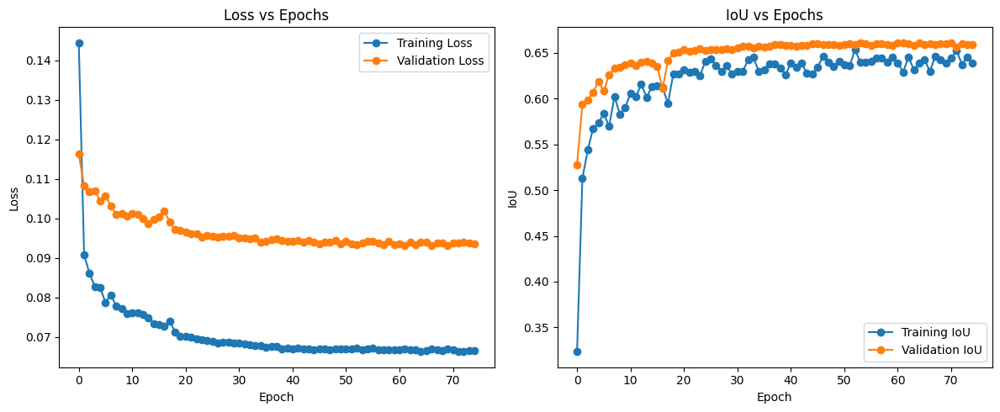

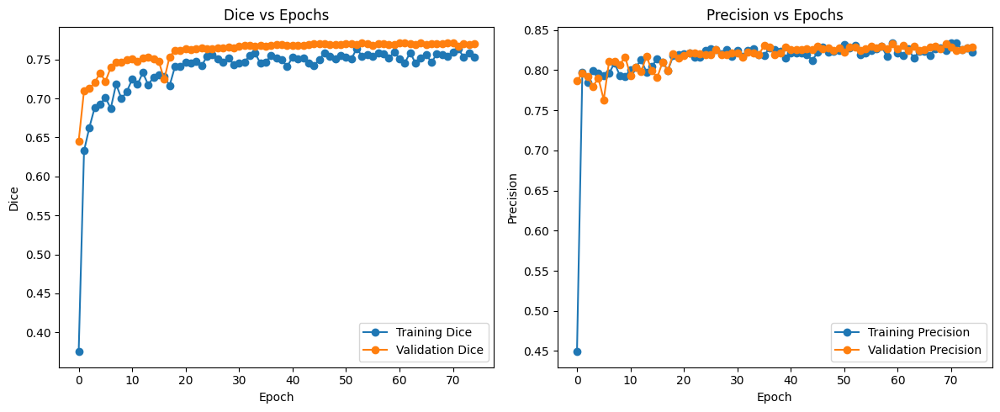

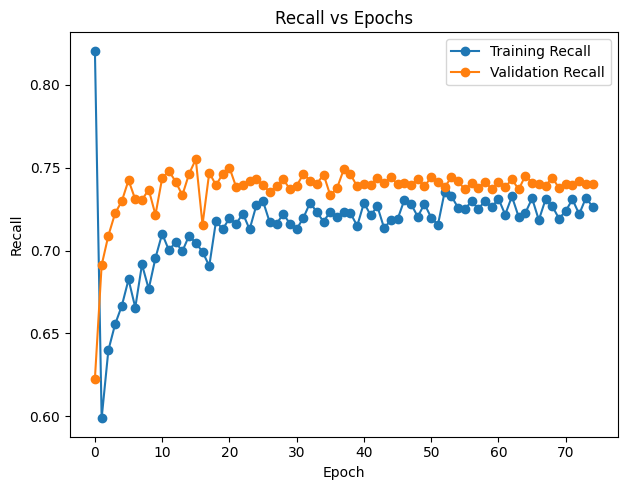

In [132]:
import matplotlib.pyplot as plt

# Assuming you have stored your metrics as dictionaries
# training_metrics and validation_metrics

# Extract the metrics
train_loss = training_metrics['loss']
train_iou = training_metrics['iou']
train_dice = training_metrics['dice']
train_precision = training_metrics['precision']
train_recall = training_metrics['recall']

val_loss = validation_metrics['loss']
val_iou = validation_metrics['iou']
val_dice = validation_metrics['dice']
val_precision = validation_metrics['precision']
val_recall = validation_metrics['recall']

# Create plots for Loss vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_loss)), train_loss, label='Training Loss', marker='o')
plt.plot(range(len(val_loss)) ,val_loss, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epochs')
plt.legend()

# Create plots for IoU vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_iou)), train_iou, label='Training IoU', marker='o')
plt.plot( range(len(val_iou)),val_iou, label='Validation IoU', marker='o')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('IoU vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Dice vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_dice)), train_dice, label='Training Dice', marker='o')
plt.plot(range(len(val_dice)),val_dice, label='Validation Dice', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.title('Dice vs Epochs')
plt.legend()

# Create plots for Precision vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_precision)), train_precision, label='Training Precision', marker='o')
plt.plot(range(len(val_precision)), val_precision, label='Validation Precision', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Recall vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_recall)), train_recall, label='Training Recall', marker='o')
plt.plot(range(len(val_recall) ), val_recall, label='Validation Recall', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [133]:
# model2 = UNET()
# model2.load_state_dict(torch.load('/kaggle/working/best_model_unet_20.pth'))
# # model.eval()

In [134]:
# model2=model2.to(device)
# validate_test_image(model2,df_valid)

In [135]:
def append_metrics_to_file(train_metrics, val_metrics, file_path):
    """
    Append training and validation metrics to a text file.

    Parameters:
    - train_metrics (dict): Dictionary containing training metrics.
    - val_metrics (dict): Dictionary containing validation metrics.
    - file_path (str): File path for the output text file.
    """
    with open(file_path, 'a') as file:
        # Append training metrics
        file.write("\nTraining Metrics:\n")
        for key, value in train_metrics.items():
            file.write(f"{key}: {value}\n")

        # Add a separator line
        file.write("\n" + "="*30 + "\n\n")

        # Append validation metrics
        file.write("Validation Metrics:\n")
        for key, value in val_metrics.items():
            file.write(f"{key}: {value}\n")

    print(f"Metrics have been appended to {file_path}")

# Example usage:


append_metrics_to_file(training_metrics, validation_metrics, 'metrics_Dplinknet_50epoches.txt')


Metrics have been appended to metrics_Dplinknet_50epoches.txt
